0.003 dt

## mouse 3 = M12_2018-03-26_14-00-10_of

mouse with 6 neurons

In [412]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.patches import Rectangle
import numpy as np
from scipy import stats
from scipy.stats import mannwhitneyu
import seaborn as sns
from scipy import signal
import statsmodels.api as sm
import math
from scipy.ndimage import gaussian_filter
from scipy import stats
from scipy.ndimage import gaussian_filter1d
from scipy import ndimage
from scipy.signal import resample
from utils.plotting import (
    plot_trajectory,
    plot_marks_clusters)
from utils.processing import (
    cluster_marks,
    add_filtered_V,
    normalize_angles_2pi)
import statistics
import os
import numpy.ma as ma
import pickle
from utils.shapely_funcs import (
    marks2shapely,
    plot_intersected_element,
    plot_shapely_traj,
    plot_shapely_mark,
    find_traj_marks_intersections,
    extract_shapely_intersections,
)

### -1. open original df (df_all) 

In [413]:
# это df c данными мышей
#data_frame_with_cells = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\sorted_clusters.pkl")
df_all = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\sorted_clusters.pkl")

df_1sess = df_all.loc[df_all['session_id']=='M12_2018-03-26_14-00-10_of']
df_1sess

,session_id,cluster_id,position_x,position_y,hd,firing_maps,firing_times,trajectory_hd,trajectory_x,trajectory_y,trajectory_times
3,M12_2018-03-26_14-00-10_of,4,"[3.769167045454546, 3.492345454545455, 3.49234...","[48.43157613636364, 49.00076931818182, 49.0007...","[129.28207574074236, 125.8086780542576, 125.80...","[[3.679618310403015, 3.4307883617976076, 3.124...","[1921.0, 2520.0, 3086.0, 103874.0, 265577.0, 2...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
4,M12_2018-03-26_14-00-10_of,5,"[4.4983375, 14.837142045454543, 38.162375, 60....","[94.24028068181816, 97.68251931818182, 99.8345...","[110.11542687261097, 43.32939731366332, 27.776...","[[0.35109411690039083, 0.346786068033974, 0.35...","[40916.0, 73892.0, 91596.0, 106838.0, 107074.0...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
10,M12_2018-03-26_14-00-10_of,11,"[3.769167045454546, 3.492345454545455, 3.49234...","[48.43157613636364, 49.00076931818182, 49.0007...","[129.28207574074236, 125.8086780542576, 125.80...","[[30.12558725981553, 29.85229457545096, 29.542...","[2231.0, 2683.0, 3057.0, 3374.0, 4172.0, 4460....",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
13,M12_2018-03-26_14-00-10_of,14,"[3.492345454545455, 3.0580363636363637, 3.1167...","[49.00076931818182, 50.16028068181818, 51.1087...","[125.8086780542576, 120.67442332774961, 120.90...","[[24.32889340798072, 24.288583681945763, 24.19...","[2772.0, 4820.0, 5917.0, 7403.0, 8344.0, 10403...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
16,M12_2018-03-26_14-00-10_of,17,"[93.84301136363638, 93.86104545454546, 93.7845...","[4.365764772727273, 4.217157954545455, 4.10625...","[-76.21545352238805, -72.32620358437994, -72.9...","[[0.07835881050409595, 0.06068925502809613, 0....","[8593226.0, 8593817.0, 8594875.0, 12027158.0, ...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
17,M12_2018-03-26_14-00-10_of,18,"[8.285063636363637, 8.285063636363637, 8.46598...","[94.53057613636362, 94.53057613636362, 94.7269...","[46.165293046903024, 46.165293046903024, 43.37...","[[4.061547894065112, 3.6359590981152197, 3.275...","[59812.0, 60102.0, 60369.0, 63026.0, 63805.0, ...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...


check whether trajectory_x are equal in rows from same session

не все записи в df_all одинаково хороши. например, 1, 7 пустые

### 0.5. Functions

In [414]:
# def occupMapNorm(df, binn, eps=0.1):
#     """ 
#     делаем df где будет понятно сколько было точек в каждом бине 
#     соответсвуеющему данному интервалу х и данному интервалу у
#     """
#     xmin = df["x"].min() - eps
#     xmax = df["x"].max() + eps
#     binx = np.linspace(xmin, xmax, binn)
#     x_cut = pd.cut(df.x, binx, right=False)

#     ymin = df["y"].min() - eps
#     ymax = df["y"].max() + eps
#     biny = np.linspace(ymin, ymax, binn)
#     y_cut = pd.cut(df.y, biny, right=False)

#     dfn = df.groupby([x_cut, y_cut], observed=False).count()
    
#     dfn = dfn.drop(columns=['x', 'y'])
#     dfn = dfn.rename(columns={'time': 'Count'})
    
#     #сделаем df с норм числами в индексах, а не с интервалами
#     L = [(a.mid, b.mid) for a, b in dfn.index]
#     dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
#     dd = dfm.unstack()
#     arrd = dd.replace(0, 1e-2).to_numpy()
#     arrsrsr = np.sqrt(np.sqrt(np.sqrt(arrd)))

#     return arrsrsr
#     #return arrsrsr, (binx, biny)

def occupMapNotNorm(df, binn, eps=0.1):
    """ 
    делаем df где будет понятно сколько было точек в каждом бине 
    соответсвуеющему данному интервалу х и данному интервалу у
    """
    xmin = df["x"].min() - eps
    xmax = df["x"].max() + eps
    binx = np.linspace(xmin, xmax, binn)
    x_cut = pd.cut(df.x, binx, right=False)

    ymin = df["y"].min() - eps
    ymax = df["y"].max() + eps
    biny = np.linspace(ymin, ymax, binn)
    y_cut = pd.cut(df.y, biny, right=False)

    dfn = df.groupby([x_cut, y_cut], observed=False).count()
    
    dfn = dfn.drop(columns=['x', 'y'])
    dfn = dfn.rename(columns={'time': 'Count'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    # arrd = dd.replace(0., 1).to_numpy()
    # arrl = np.log(arrd)
    # arrl = df_minmax(arrl)
    
    #rotate to traj
    dd = dd.transpose()
    dd = dd.iloc[::-1]
    return dd, (binx, biny)

#таблица с траекторией
def makebasDF(n):
    x = df_all['trajectory_x'].iloc[n] 
    y = df_all['trajectory_y'].iloc[n]
    time = df_all['trajectory_times'].iloc[n]
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])
    #df = df.loc[df['time']<=1000]
    #print(df)
    #plot_trajectory(df['x'],df['y'])
    return df

def makebasDF2(row):
    x = row['trajectory_x']
    y = row['trajectory_y']
    time = row['trajectory_times']
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])
    #df = df.loc[df['time']<=1000]
    #print(df)
    #plot_trajectory(df['x'],df['y'])
    return df

def makebasNpfromRow(row):
    x = row['trajectory_x']
    y = row['trajectory_y']
    time = row['trajectory_times']
    tr_np = np.dstack((time, x, y))
    return tr_np[0]

def rescale_coord(data, new_min, new_max):
    min_old_x, max_old_x = np.min(data), np.max(data)
    data_rescaled = ((data - min_old_x) / (max_old_x - min_old_x)) * (new_max - new_min) + new_min
    return data_rescaled

#near corner: code 50
#near wall (not near corner): code 5
#center: code 0
def sort_walls_area_simple(tr, border_tr, wall_percent=0.1): 
    ylen = border_tr['ymax'] - border_tr['ymin'] 
    xlen = border_tr['xmax'] - border_tr['xmin'] 
    xl = border_tr['xmin'] + xlen * wall_percent
    xr = border_tr['xmax'] - xlen * wall_percent
    yd = border_tr['ymin'] + ylen * wall_percent
    yu = border_tr['ymax'] - ylen * wall_percent

    tr['near_wall'] = 0.
    for i in range(len(tr)):     
        if tr['x'].iloc[i] < xl:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 50
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 50
            else:
                tr['near_wall'].iloc[i] = 5
        elif tr['x'].iloc[i] > xr:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 50
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 50
            else:
                tr['near_wall'].iloc[i] = 5
        elif tr['y'].iloc[i] > yu:
            tr['near_wall'].iloc[i] = 5
        elif tr['y'].iloc[i] < yd:
            tr['near_wall'].iloc[i] = 5
    return tr

def plotNs(df, t, signals_list, deltat=0.5):
    t1 = t-deltat/2
    t2 = t+deltat/2
    df = df.loc[(df['time']>=t1)&(df['time']<=t2)]
    plt.figure(figsize=(15,4))
    for s in signals_list:
        plt.plot(df['time'], df[s], label=s)
    plt.axvline(x=t, color='m')
    plt.legend()
    plt.show()
    return df

#def cutNs(df, t, signals_list, deltat=0.5):
    


### 1. Plot heatmaps of spikes

#### make df with trajectory points during spikes

In [14]:
print(max(df_1sess.loc[df_1sess['cluster_id']==4]['position_x'].iloc[0]),min(df_1sess.loc[df_1sess['cluster_id']==4]['position_x'].iloc[0]))
print(max(df_1sess.loc[df_1sess['cluster_id']==4]['position_y'].iloc[0]),min(df_1sess.loc[df_1sess['cluster_id']==4]['position_y'].iloc[0]))
print(max(df_1sess.loc[df_1sess['cluster_id']==4]['trajectory_x'].iloc[0]),min(df_1sess.loc[df_1sess['cluster_id']==4]['trajectory_x'].iloc[0]))
print(max(df_1sess.loc[df_1sess['cluster_id']==4]['trajectory_y'].iloc[0]),min(df_1sess.loc[df_1sess['cluster_id']==4]['trajectory_y'].iloc[0]))
xma_old = max(df_1sess.loc[df_1sess['cluster_id']==4]['trajectory_x'].iloc[0])
xmi_old = min(df_1sess.loc[df_1sess['cluster_id']==4]['trajectory_x'].iloc[0])
yma_old = max(df_1sess.loc[df_1sess['cluster_id']==4]['trajectory_y'].iloc[0])
ymi_old = min(df_1sess.loc[df_1sess['cluster_id']==4]['trajectory_y'].iloc[0])

101.55219318181818 0.04875761363636362
100.41890272727272 0.41762159090909073
102.37848863636363 0.0
100.51190568181816 0.0


In [36]:
def rescale_coord_add(data, new_min, new_max, min_old_x, max_old_x):
    #min_old_x, max_old_x = np.min(data), np.max(data)
    data_rescaled = ((data - min_old_x) / (max_old_x - min_old_x)) * (new_max - new_min) + new_min
    return data_rescaled

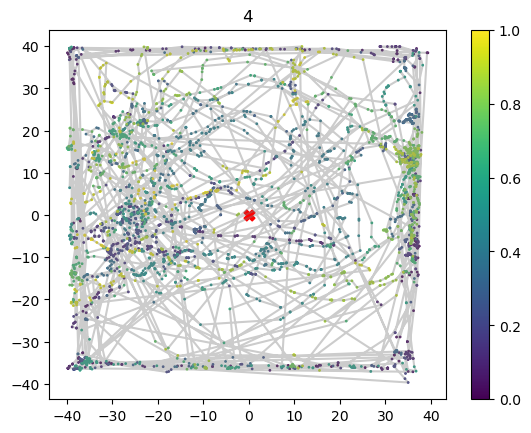

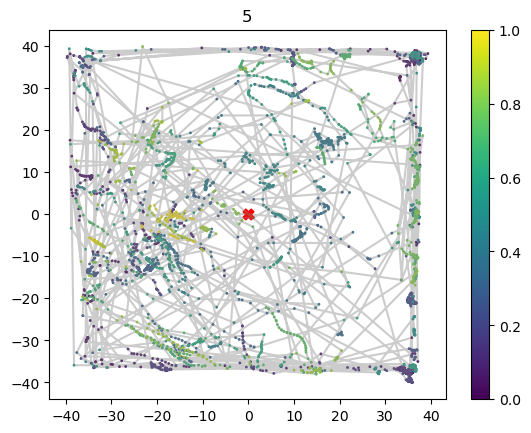

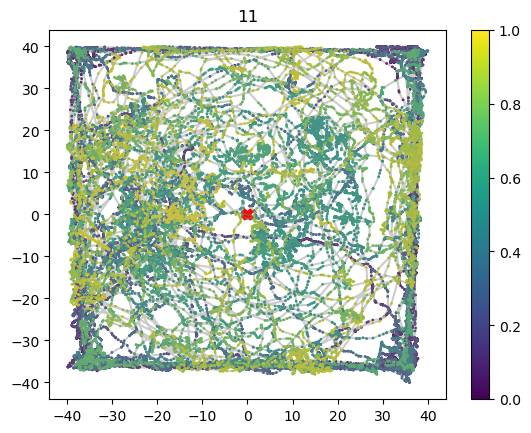

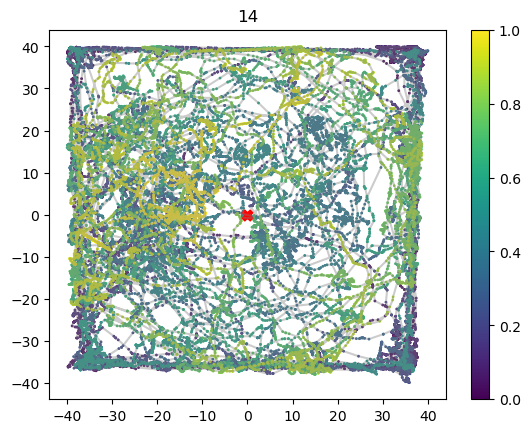

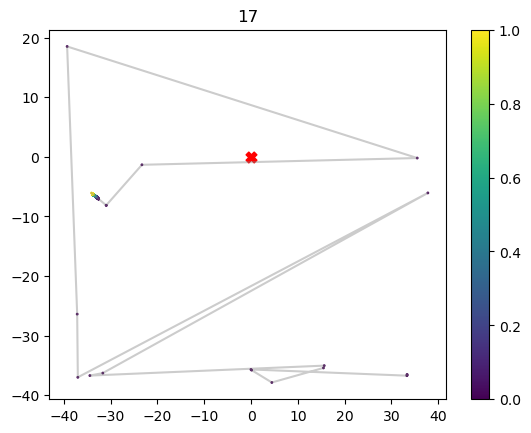

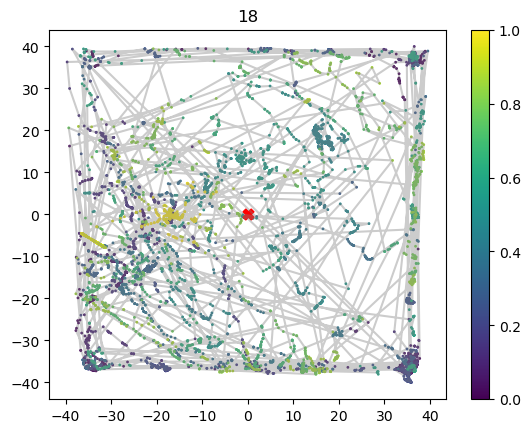

In [37]:
clust_ns = df_1sess['cluster_id'].tolist()
spike_dfs = {}
for n in clust_ns:
    x = rescale_coord_add(np.array(df_1sess.loc[df_1sess['cluster_id']==n]['position_x'].iloc[0]), -40, 40, xmi_old, xma_old) 
    y = rescale_coord_add(np.array(df_1sess.loc[df_1sess['cluster_id']==n]['position_y'].iloc[0]), -40, 40, ymi_old, yma_old) 
    t = df_1sess.loc[df_1sess['cluster_id']==n]['firing_times'].iloc[0] / 30000
    plot_trajectory(x, y, title=str(n))
    F = pd.DataFrame({'time': t, 'x': x, 'y': y})
    spike_dfs[n] = F

In [7]:
#make occupancy heatmaps

In [9]:
# def cut_jumps(df, xmax, xmin, ymax, ymin, show=True):
#     """
#     Simply drops samples with jumps onto the walls
#     """
#     dff = df[(df['x'] < xmax) & (df['x'] > xmin) & (df['y'] < ymax) & (df['y'] > ymin)]
#     ind = range(0, len(dff))
#     dff = dff.reindex(ind)
#     if show:
#         # plot_trajectory(dff['x'], dff['y'])
#         print('not implemented')
#     return dff

In [12]:
#spike_dfs

#### (not important) occ map not norm not smoothed

In [17]:
from scipy import ndimage

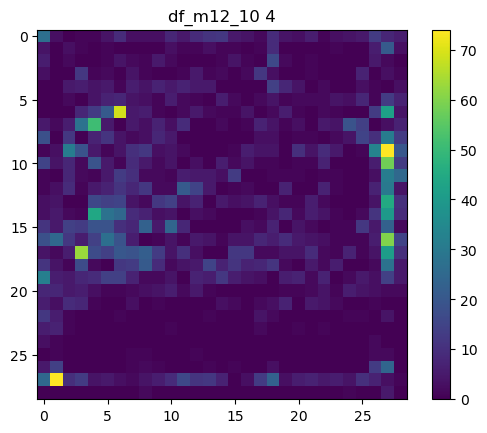

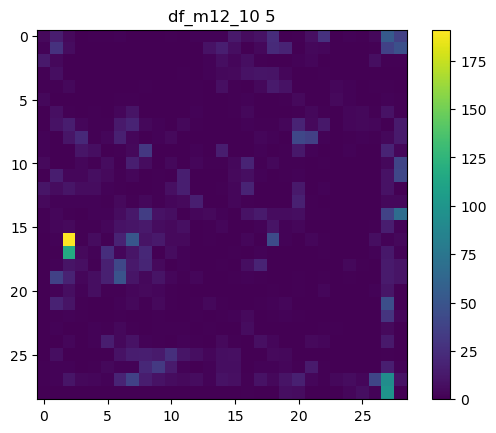

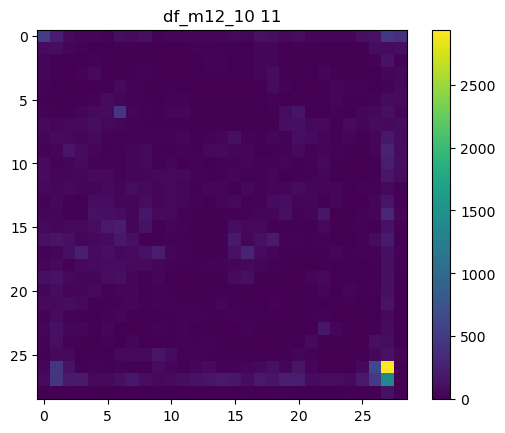

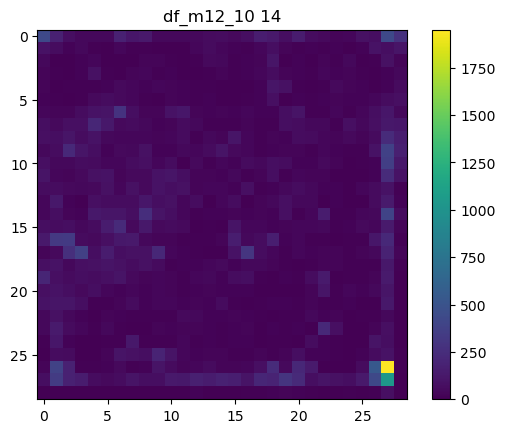

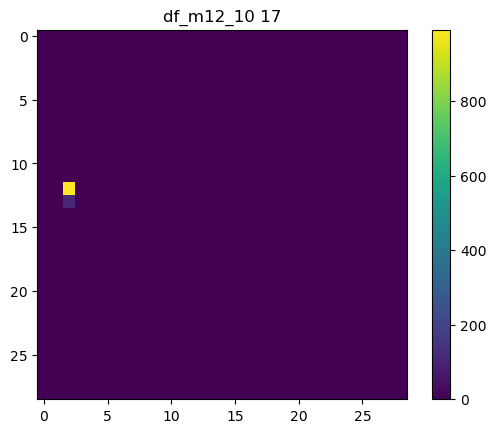

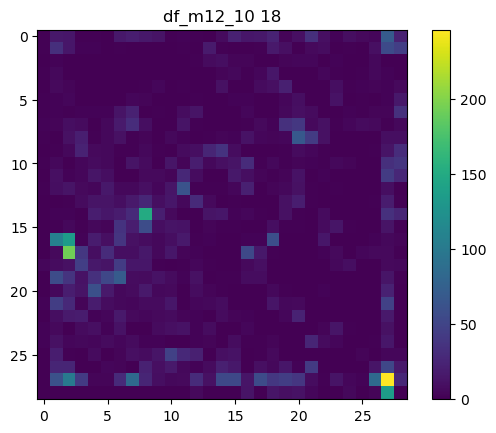

In [49]:
occ_traj_fire = {}
bins = {}
for n in spike_dfs:
    k = 'df_m12_10'
    k_add = ' '+str(n)
    occ, b = occupMapNotNorm(spike_dfs[n], binn=30)
    #occ_s = ndimage.fourier_gaussian(occ, 0.8, n=-1)
    # sns.heatmap(occ, square=True, xticklabels=False,
    #             yticklabels=False, cmap='Blues')
    occ_traj_fire[n] = occ
    bins[n] = b
    plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
    plt.title(k + k_add)
    plt.colorbar()
    #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
    # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
    plt.show()   

In [39]:
for k, dd in occ_traj_fire.items():
    print(k)
    print(dd)

4
          Count                                                          \
y       2.0455  5.5005  8.9555  12.4105 15.8660 19.3215 22.7765 26.2315   
x                                                                         
1.7024        0      25       5       0       3       6      12       6   
5.2095        0      74      14       1       1       7       6       3   
8.7165        0      10       0       0       0       1       1       9   
12.2235       0      13       0       0       0       0       0       8   
15.7305       0       4       0       0       0       0       0       1   
19.2375       0       5       0       0       0       0       0       0   
22.7445       0       3       0       0       0       0       1       0   
26.2515       0       2       1       1       0       0       0       3   
29.7585       2       4       2       1       0       0       0       0   
33.2655       0       6       1       0       0       0       0       1   
36.7725       0       9

#### correctly rotated occ map not norm not smoothed

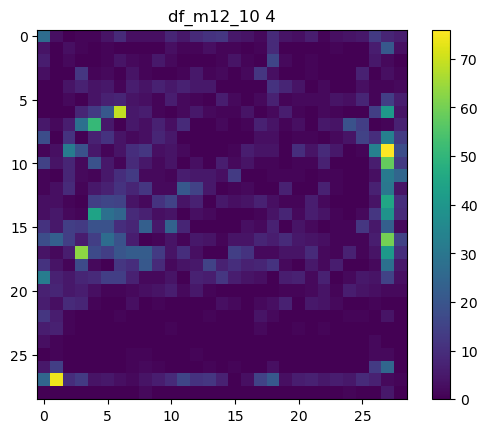

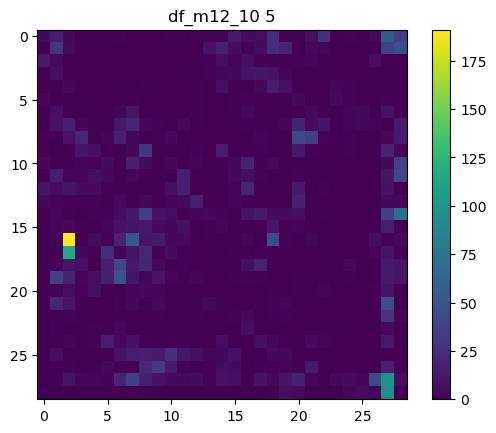

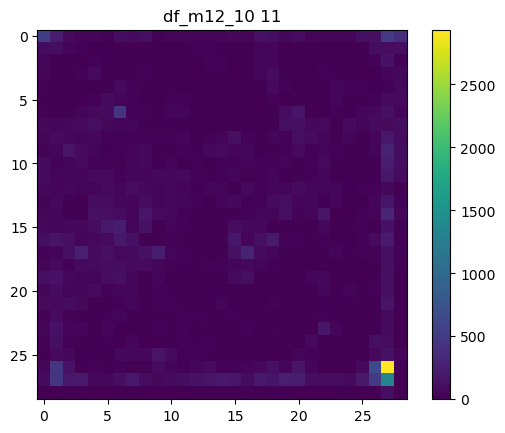

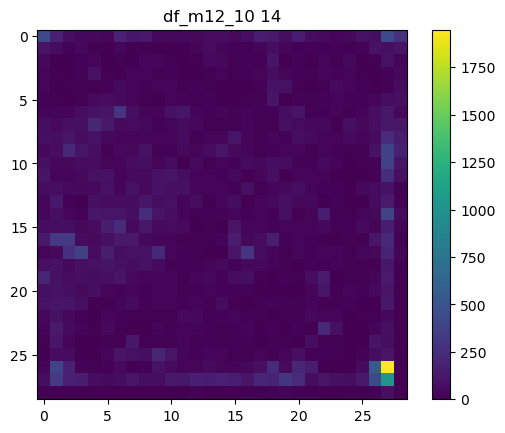

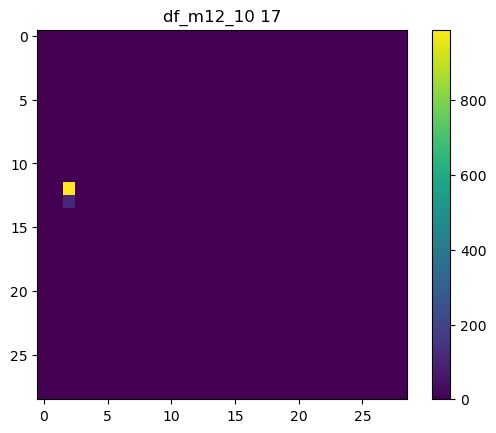

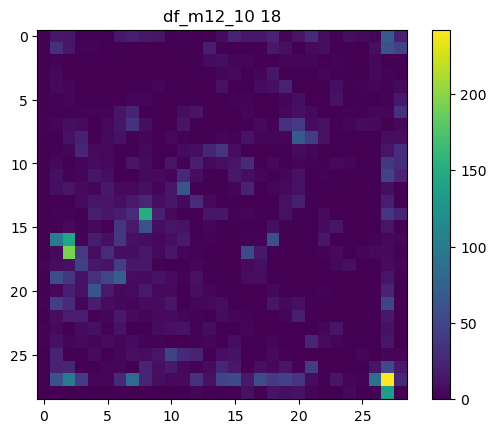

In [415]:
occ_traj_fire = {}
bins = {}
for n in spike_dfs:
    k = 'df_m12_10'
    k_add = ' '+str(n)
    occ, b = occupMapNotNorm(spike_dfs[n], binn=30)
    #occ_s = ndimage.fourier_gaussian(occ, 0.8, n=-1)
    # sns.heatmap(occ, square=True, xticklabels=False,
    #             yticklabels=False, cmap='Blues')
    occ_traj_fire[n] = occ
    bins[n] = b
    plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
    plt.title(k + k_add)
    plt.colorbar()
    #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
    # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
    plt.show()   

In [416]:
for k, dd in occ_traj_fire.items():
    print(k)
    print(dd)

4
x               -38.6910  -35.9490  -33.2070  -30.4650  -27.7230  -24.9810  \
      y                                                                      
Count  38.6500        27         3         0         1         1         4   
       35.8985         4         0         3         1         0         1   
       33.1470         6         0         2         0         0         1   
       30.3955         3         0         0        12         1         2   
       27.6440         0         0         4         7         4         5   
       24.8925         0         0         2         0         4         7   
       22.1410         0         0         0         8        13        21   
       19.3895         5         2         6        28        51         5   
       16.6380        18         0        11         0         7        11   
       13.8865         1         3        32        19         5         1   
       11.1350        15         4         8         2        

#### (not important) occ map not norm smoothed

In [417]:

for n in spike_dfs:
    k = 'df_m12_10'
    k_add = ' '+str(n)
    occ = occupMapNotNorm(spike_dfs[n], binn=30)
    occ_s = ndimage.fourier_gaussian(occ, 1, n=-1)
    # sns.heatmap(occ, square=True, xticklabels=False,
    #             yticklabels=False, cmap='Blues')
    
    plt.imshow(occ_s) #interpolation='bilinear', cmap='rainbow')
    plt.title(k + k_add)
    plt.colorbar()
    #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
    # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
    plt.show()   

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\ndimage\_fourier.py:119: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  input = numpy.asarray(input)


RuntimeError: data type not supported

In [24]:
# for n in spike_dfs:
#     k = 'df_m12_10'
#     k_add = ' '+str(n)
#     occ = occupMapNorm(spike_dfs[n], binn=40)
#     #occ_s = ndimage.fourier_gaussian(occ, 0.8, n=-1)
#     # sns.heatmap(occ, square=True, xticklabels=False,
#     #             yticklabels=False, cmap='Blues')
    
#     plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
#     plt.title(k + k_add)
#     plt.colorbar()
#     #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
#     # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
#     plt.show()   

In [13]:
# #occupancy map
# n = 17
# k = 'df_m12_10'
# k_add = ' '+str(n)
# occ = occupMapNotNorm(spike_dfs[n], binn=40)
# occ_s = ndimage.fourier_gaussian(occ, 0.8, n=-1)
# # sns.heatmap(occ, square=True, xticklabels=False,
# #             yticklabels=False, cmap='Blues')

# plt.imshow(occ_s) #interpolation='bilinear', cmap='rainbow')
# plt.title(k + k_add)
# plt.colorbar()
# #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
# # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
# plt.show()

#### HM based on mean (not count)

##### make occ map of whole trajectory

and replace low values with 0

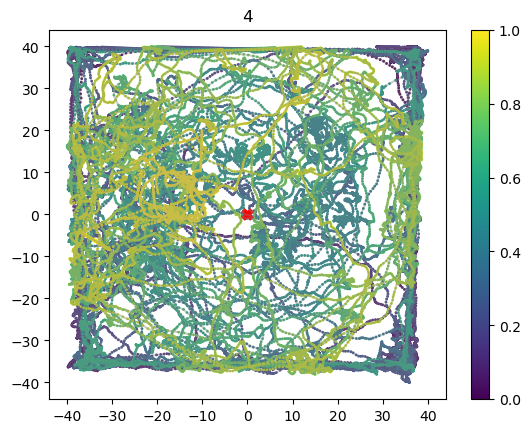

In [418]:
clust_ns = df_1sess['cluster_id'].tolist()
n = clust_ns[0]
x = rescale_coord_add(np.array(df_1sess.loc[df_1sess['cluster_id']==n]['trajectory_x'].iloc[0]), -40, 40, xmi_old, xma_old) 
y = rescale_coord_add(np.array(df_1sess.loc[df_1sess['cluster_id']==n]['trajectory_y'].iloc[0]), -40, 40, ymi_old, yma_old) 
t = df_1sess.loc[df_1sess['cluster_id']==n]['trajectory_times'].iloc[0]
plot_trajectory(x, y, title=str(n))
F = pd.DataFrame({'time': t, 'x': x, 'y': y})
traj_whole = F

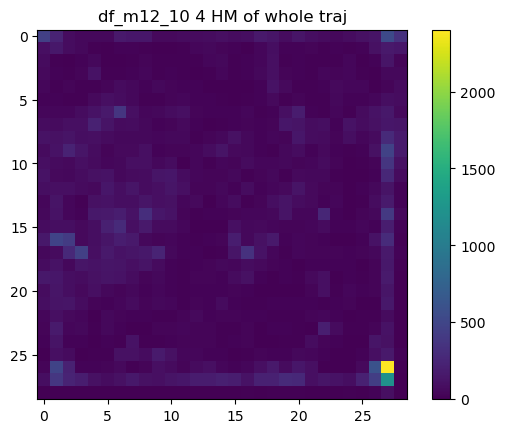

In [419]:
k = 'df_m12_10'
k_add = ' '+str(n) + ' HM of whole traj'
occ_whole, binxy_whole = occupMapNotNorm(traj_whole, binn=30)
plt.imshow(occ_whole) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
#k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
# plt.savefig(d+'occ_map_'+k+k_add2+'.png')
plt.show()   

In [420]:
occ_whole_np = occ_whole.to_numpy()

occ_whole_np[occ_whole_np < 30.] = 0

occ_whole = pd.DataFrame(occ_whole_np, columns=list(range(29)))

In [421]:
occ_whole_np

array([[ 459,  237,   81,   56,   51,   47,  161,  143,  144,   60,   63,
          67,   71,   77,   97,   79,   88,  163,  138,   83,  132,   88,
          69,   52,   77,  108,  124,  538,  345],
       [ 102,  152,   76,   50,    0,    0,    0,    0,    0,    0,    0,
           0,   45,   47,    0,    0,    0,   44,   88,    0,    0,   31,
           0,    0,    0,    0,  107,  160,  142],
       [  69,    0,    0,    0,   49,    0,    0,    0,   33,    0,    0,
           0,    0,   43,   50,    0,    0,   39,  103,    0,    0,    0,
           0,    0,   39,    0,    0,  133,   33],
       [  61,    0,    0,   31,  119,    0,    0,    0,   40,    0,    0,
           0,    0,    0,   38,    0,    0,   48,   97,   36,    0,    0,
          43,   33,   38,    0,    0,   48,   53],
       [  40,    0,   31,    0,    0,   35,   67,   55,    0,   48,   33,
           0,    0,    0,    0,    0,    0,    0,  121,   65,    0,    0,
           0,   63,   41,   42,    0,   35,   67],
     

In [17]:
# dt = (1945.313759 - 0.030712) / len(traj_whole)
# 1 / dt

##### divide occ map of trajectory with spikes by whole trajectory i take them for further analysis

In [18]:
# occ_fire_np4 = occ_traj_fire[4].to_numpy()
# occ_whole_np = occ_whole.to_numpy()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\2289702121.py:5: RuntimeWarning: divide by zero encountered in divide
  occ_fire_divide_np[n] = occ_traj_fire[n].to_numpy() / occ_whole_np
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\2289702121.py:5: RuntimeWarning: invalid value encountered in divide
  occ_fire_divide_np[n] = occ_traj_fire[n].to_numpy() / occ_whole_np


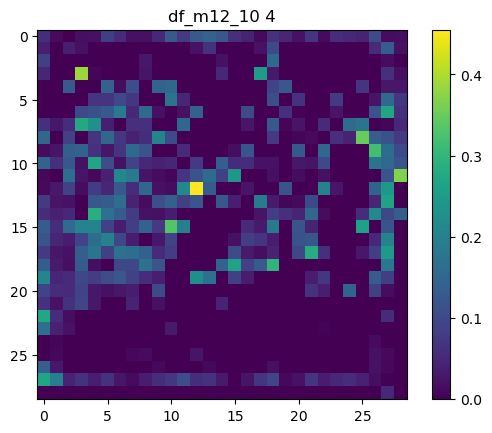

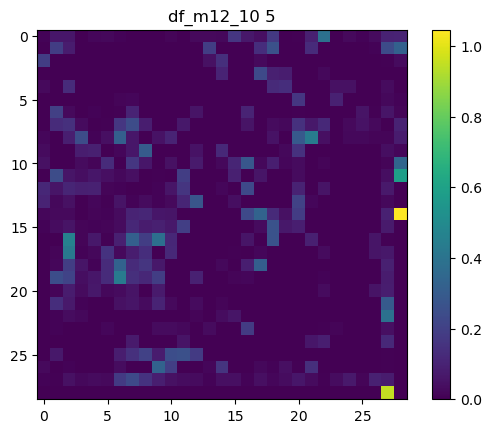

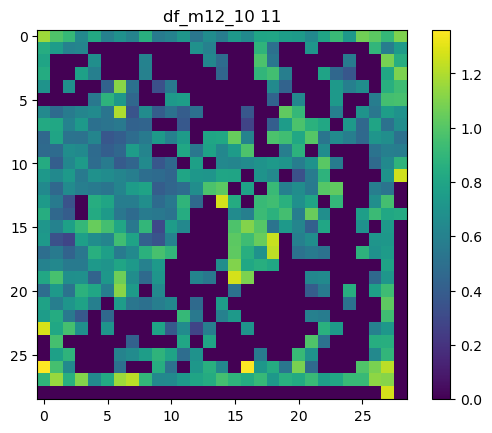

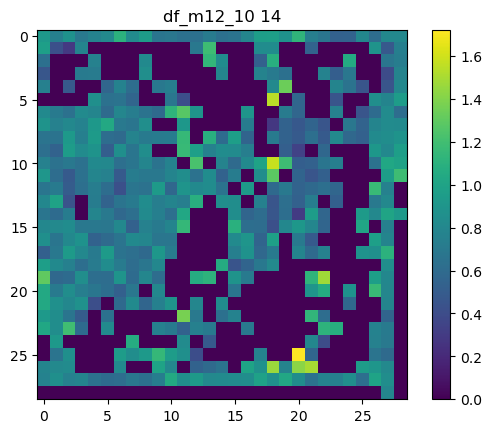

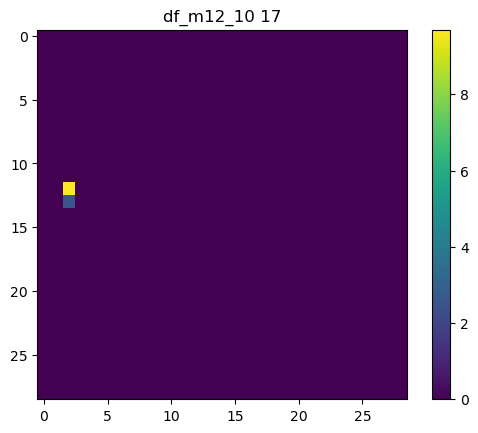

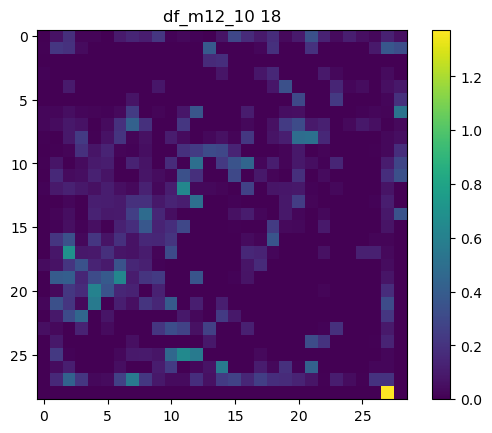

In [44]:
#occ_fire_divide_np - dict with np arrays
k = 'df_m12_10'
occ_fire_divide_np = {}
for n in occ_traj_fire:
    occ_fire_divide_np[n] = occ_traj_fire[n].to_numpy() / occ_whole_np
    occ_fire_divide_np[n] = np.nan_to_num(occ_fire_divide_np[n],0,0,0)
    occ_fire_divide_np[n] = np.around(occ_fire_divide_np[n], decimals=3)
    plt.imshow(occ_fire_divide_np[n]) #interpolation='bilinear', cmap='rainbow')
    plt.title(k + ' ' + str(n))
    plt.colorbar()
    plt.show()
        

In [45]:
dfs_divide = {}
for k, arr in occ_fire_divide_np.items():
    dfs_divide[k] = pd.DataFrame(arr, columns=list(range(29))) 
    #print(k)
    #print(arr)

In [59]:
pickle.dump(dfs_divide, open( "mouse3_hm_divide.p", "wb"))

#### hm to points

In [49]:
#7 функция окууп карта меток dfHM
#parameter to change!!!!! n
# тут, может есть лишние вращения, но изначально (до этого шага) и в результате этого шага все расположено правильно, 
# в единой системе координат
#поч немного поменялось расположение меток, наверное, были смещены границы/бины
from utils.processing import df_minmax

#METKA_THRESH = 0.4
#BINN = 30
#SCALING = 'log'

#def make_occup_map(df, n=20, eps=1e-3, scaling='sqrt', show=True):

#8 делаем координаты новых "меток" - центров квадратов, в которых достаточно много меток
def heat_maps_with_coords(dfHM, binxy, k=0.5, tit='', show=True):
    
    # 1. threshold
    METKA_THRESH = k * dfHM.to_numpy().max()
    
    
    # 2. occ map in which indices are coordinates
    binx, biny = binxy
    binxmid, binymid = [], []
    for i in range(1, len(binx)):
        binxmid.append((binx[i] + binx[i-1]) / 2)
        binymid.append((biny[i] + biny[i-1]) / 2)
    dfHM.index = binxmid[::-1]
    dfHM.columns = binymid

    # 3. take coordinates of cells with sufficient amount of urine marks 
    # координаты меток т.е. i это y (row) а j это x (column)
    # parameter to change 0.3
    trN_coords, trN_coeff = [], []
    for i in range(dfHM.shape[0]-1, -1, -1):
        for j in range(dfHM.shape[1]):
            if dfHM.iloc[i, j] > METKA_THRESH:
                trN_coords.append((dfHM.columns[j], dfHM.index[i]))
                trN_coeff.append((dfHM.iloc[i, j]))
    if show:
        plt.figure(figsize=(4, 4))
        plt.xlim(-40, 40)
        plt.ylim(-40, 40)
        trN_coords_x = [i[0] for i in trN_coords]
        trN_coords_y = [i[1] for i in trN_coords]
        plt.scatter(trN_coords_x, trN_coords_y)
        plt.title(tit)
        plt.show()

    return trN_coords, trN_coeff

# hm_marks_coords = {}
# hm_marks_coeff = {}
# for n in used_mice:
#     df = rescaled_marks[n]
#     df['c'] = np.ones((rescaled_marks[n].shape[0])) # instead of time

#     marks_coords, mark_coeff = heat_maps_with_coords(df, tit=n)
#     hm_marks_coords[n] = marks_coords
#     hm_marks_coeff[n] = mark_coeff

##### threshold selection (skip)

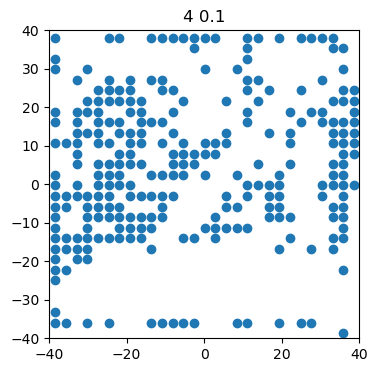

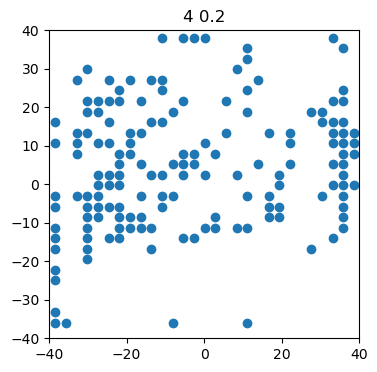

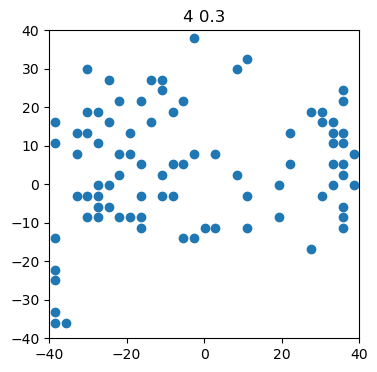

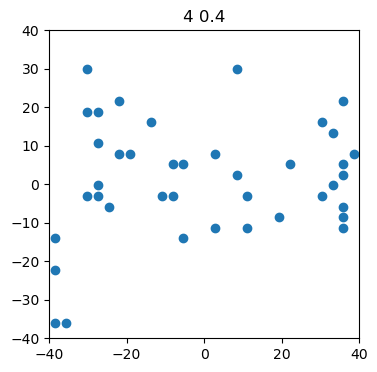

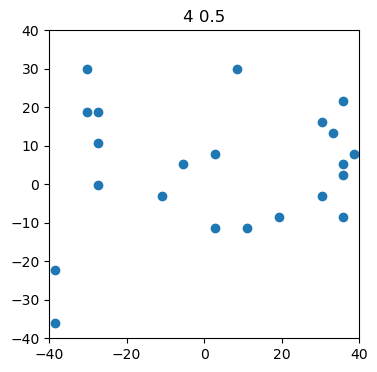

...

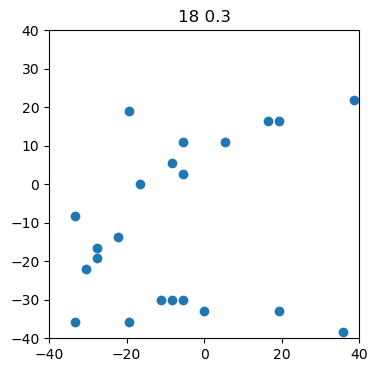

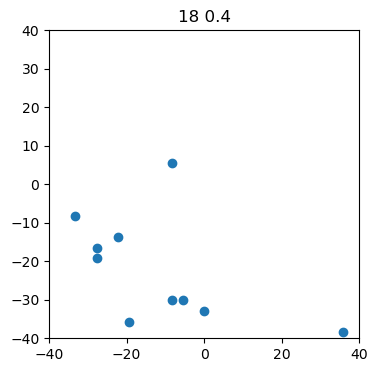

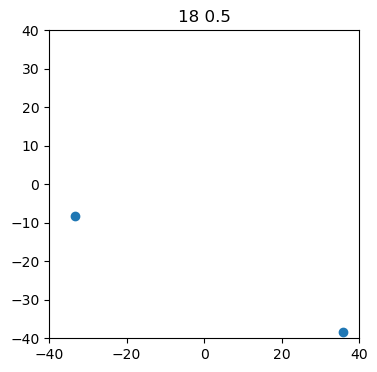

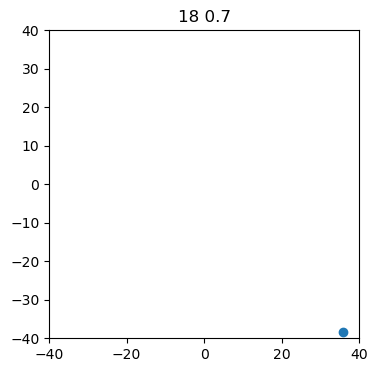

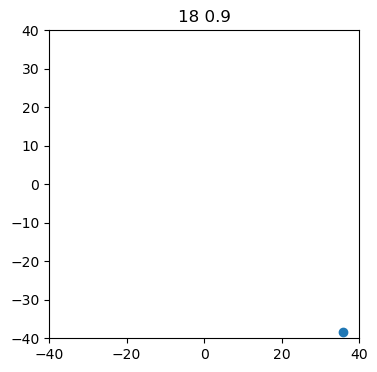

In [50]:
n_points_dict = {}
for k in dfs_divide:
    n_points = []
    for i in (0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9):
        coord, coeff = heat_maps_with_coords(dfs_divide[k], bins[k], k=i, tit=str(k)+' '+str(i))
        n_points.append(len(coord))
    n_points_dict[k] = n_points

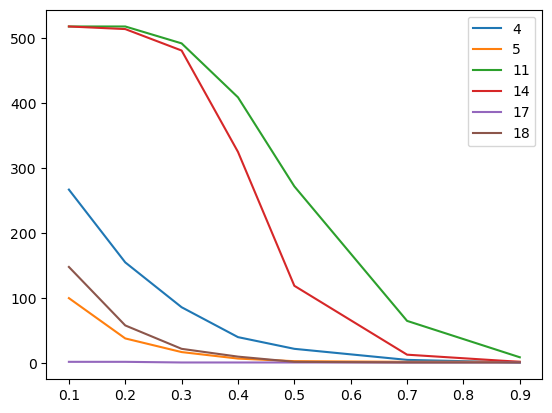

In [51]:
for m, n_p in n_points_dict.items():
    plt.plot((0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9), n_p, label=str(m))
plt.legend()

In [52]:
threses = {4: 0.4, 5: 0.4, 11:0.7, 14:0.7, 17:0.4, 18:0.4}

##### make new neuron marks

In [53]:
threses = {4: 0.4, 5: 0.4, 11:0.7, 14:0.7, 17:0.4, 18:0.4}

In [55]:
DIR = 'neuro_preprocessed_dataset/mouse3'

In [41]:
fname = f'{DIR}/mouse3_hm_divide.p'
with open(fname, 'rb') as f:
    dfs_divide = pickle.load(f)

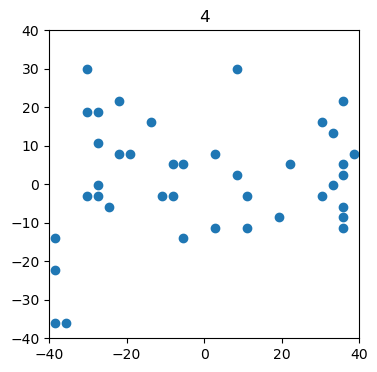

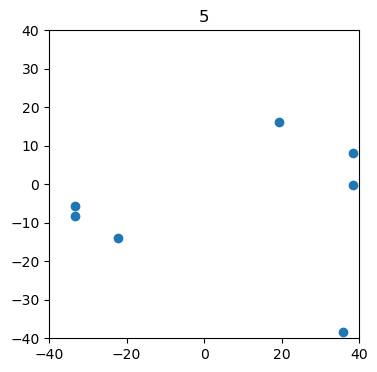

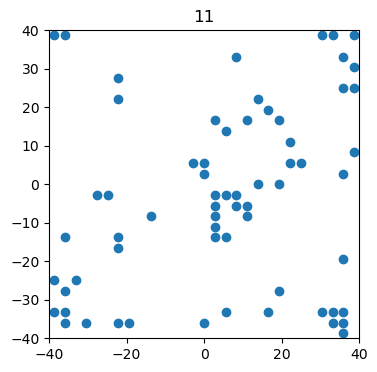

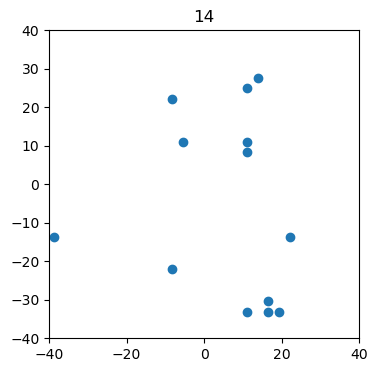

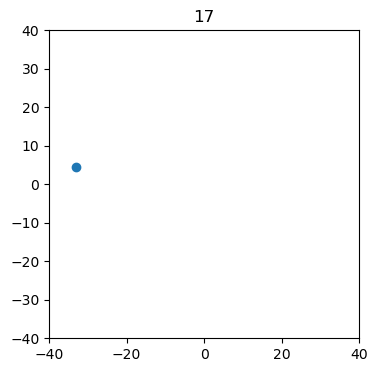

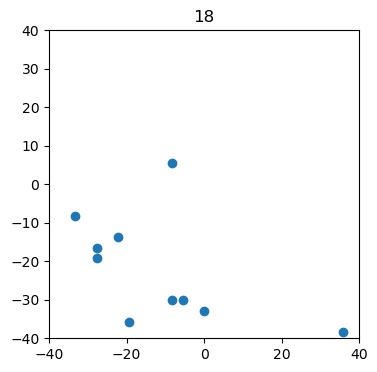

In [60]:
coords_dict = {}
coeff_dict = {}
for k in dfs_divide:
    coords_dict[k], coeff_dict[k] = heat_maps_with_coords(dfs_divide[k], bins[k], k=threses[k], tit=str(k))

### shapely part 1

#### Cluster marks and save as df

##### with bad clusters (can be skipped)

In [61]:
from utils.plotting import plot_marks_clusters
from utils.processing import cluster_marks
BINN = 30

clustered_marks_bad = {}

for k in coords_dict.keys():
    # cparams = clust_params[k]
    marks_coords = coords_dict[k] 
    mark_coeff = coeff_dict[k]   # ~ occup map
    if k==5 or k==18:
        lab = cluster_marks(marks_coords,
                        eps=6,
                        min_samples=2,
                        show=False)
    else:
        lab = cluster_marks(marks_coords,
                        eps=6,
                        min_samples=3,
                        show=False)
    X = np.asarray(marks_coords)
    df_marks = pd.DataFrame(data={'x': X[:, 0],
                                'y': X[:, 1],
                                'coeff': mark_coeff,
                                'cluster': lab})
    #df_marks = df_marks[df_marks['cluster'] >= 0].reset_index(drop=True)
    clustered_marks_bad[k] = df_marks

4


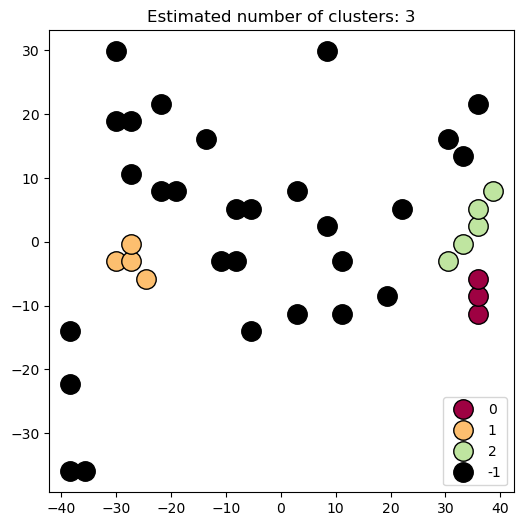

[-1  0  1  2]
5


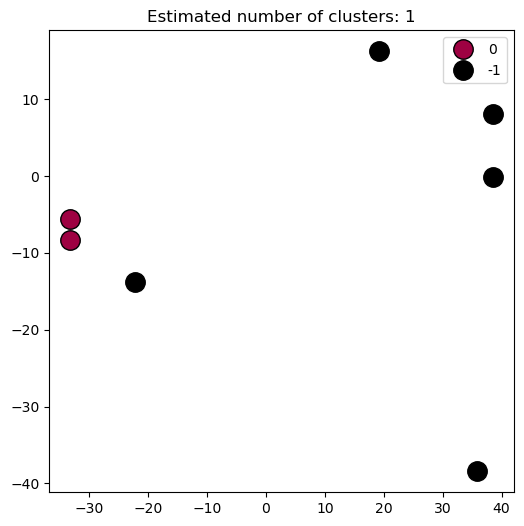

[-1  0]
11


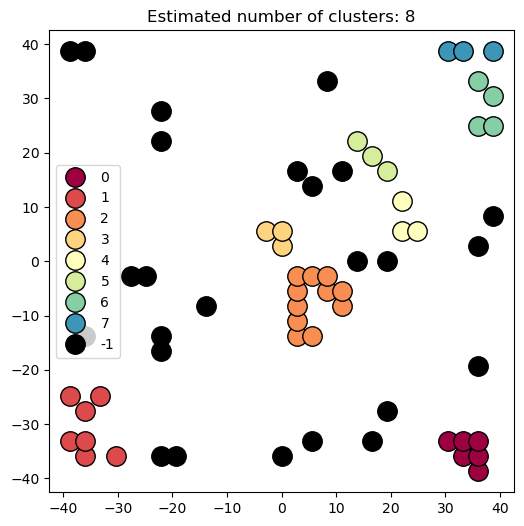

[-1  0  1  2  3  4  5  6  7]
14


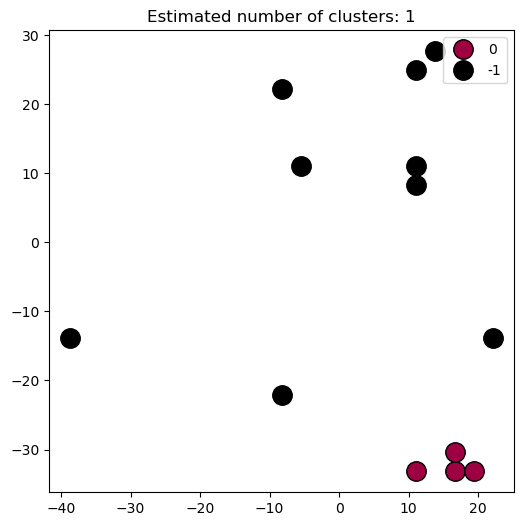

[-1  0]
17


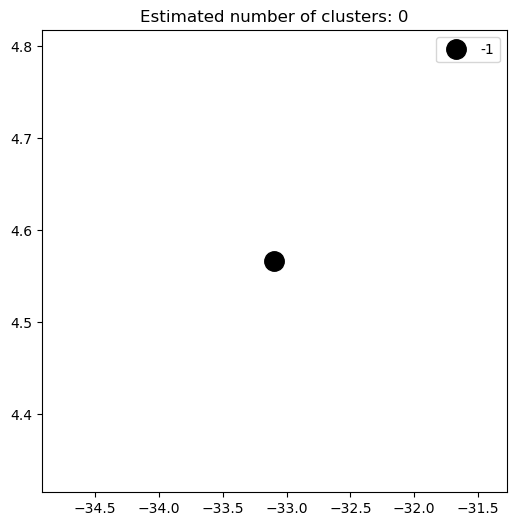

[-1]
18


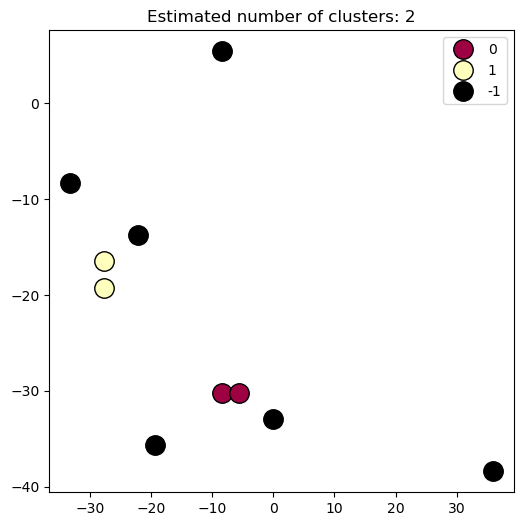

[-1  0  1]


In [62]:
for n in clustered_marks_bad:
    print(n)
    df_marks = clustered_marks_bad[n]
    X = df_marks[['x', 'y']].to_numpy()
    c = df_marks['cluster'].to_numpy()
    plot_marks_clusters(X, c)
    print(np.unique(c))

##### without bad clusters

In [63]:
del coords_dict[17]

In [64]:
from utils.plotting import plot_marks_clusters
from utils.processing import cluster_marks
BINN = 30
#SCALING = 'log'

NEURO_DIR = 'neuro_preprocessed_dataset/mouse3'
# clust_params = {
#         'tr3': {'eps': 7, 'min_samples': 1},
#         'tr5': {'eps': 5, 'min_samples': 1},
#         'tr6': {'eps': 4, 'min_samples': 1},
#         'tr7': {'eps': 7, 'min_samples': 1},
#         'tr91': {'eps': 5, 'min_samples': 3}}

clustered_marks = {}

for k in coords_dict.keys():
    # cparams = clust_params[k]
    marks_coords = coords_dict[k] 
    mark_coeff = coeff_dict[k]   # ~ occup map
    if k==5 or k==18:
        lab = cluster_marks(marks_coords,
                        eps=6,
                        min_samples=2,
                        show=False)
    else:
        lab = cluster_marks(marks_coords,
                        eps=6,
                        min_samples=3,
                        show=False)
    X = np.asarray(marks_coords)
    df_marks = pd.DataFrame(data={'x': X[:, 0],
                                'y': X[:, 1],
                                'coeff': mark_coeff,
                                'cluster': lab})
    df_marks = df_marks[df_marks['cluster'] >= 0].reset_index(drop=True)
    clustered_marks[k] = df_marks
    
    savename = f'{NEURO_DIR}/marks_{k}_{BINN}bin.pkl'
    with open(savename, 'wb') as fp:    # NOTE: uncomment to save
        pickle.dump(df_marks, fp)

In [66]:
savename = f'{NEURO_DIR}/clustered_marks_{BINN}bin.pkl'
with open(savename, 'wb') as fp:    # NOTE: uncomment to save
    pickle.dump(clustered_marks, fp)

4


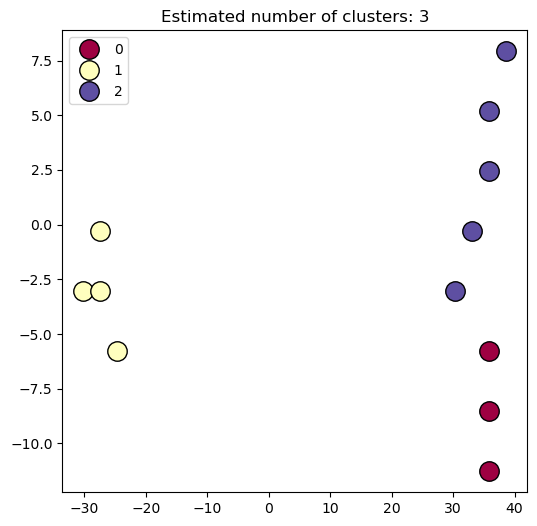

[0 1 2]
5


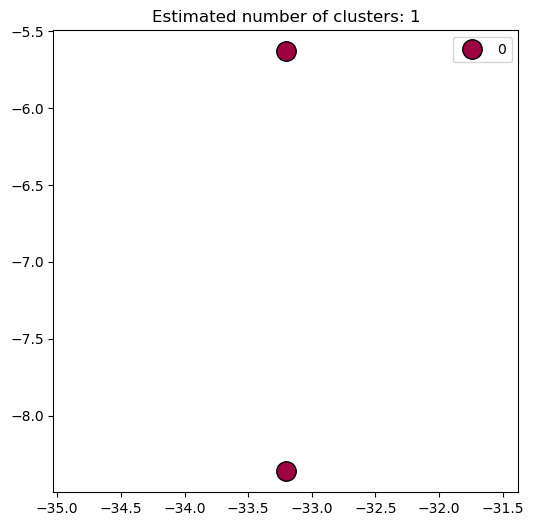

[0]
11


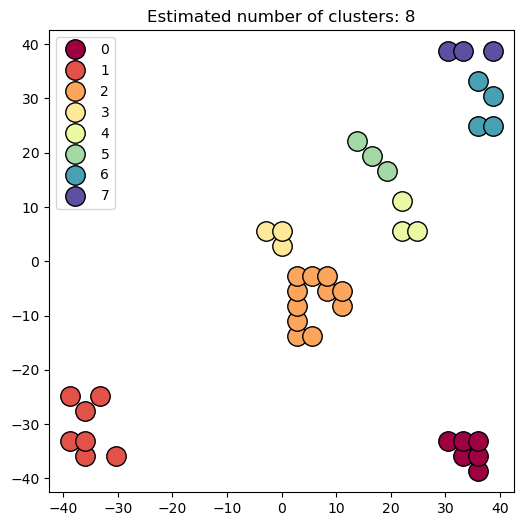

[0 1 2 3 4 5 6 7]
14


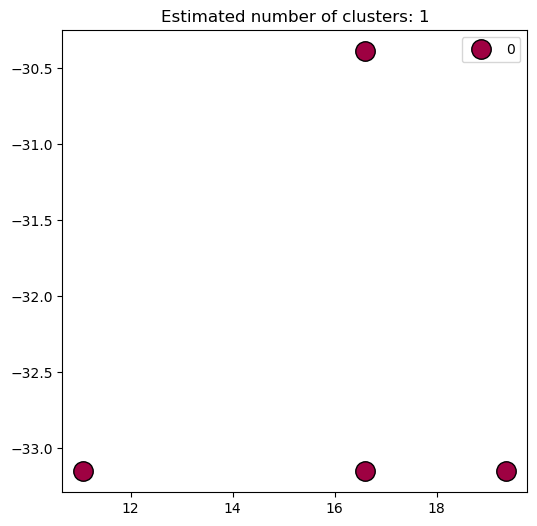

[0]
18


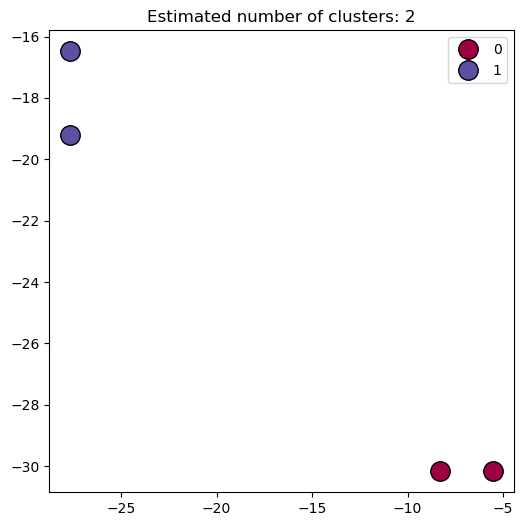

[0 1]


In [67]:
for n in clustered_marks:
    print(n)
    df_marks = clustered_marks[n]
    X = df_marks[['x', 'y']].to_numpy()
    c = df_marks['cluster'].to_numpy()
    plot_marks_clusters(X, c)
    print(np.unique(c))

#### Define area around marks

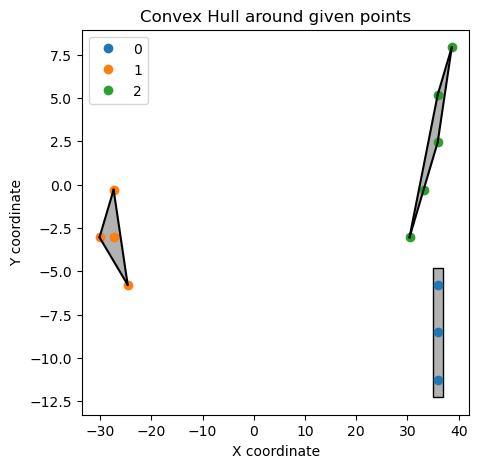

In [68]:
from scipy.spatial import ConvexHull

def plot_bound_box(points, buffer=1.0, lab=None):
    x_min, y_min = points.min(axis=0) - buffer
    x_max, y_max = points.max(axis=0) + buffer

    plt.plot(points[:, 0], points[:, 1], 'o', label=lab)
    currentAxis = plt.gca()
    currentAxis.add_patch(Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     alpha=0.3, facecolor='black'))
    currentAxis.add_patch(Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     edgecolor='black', facecolor='none'))

plt.figure(figsize=(5, 5))

#i guess
df_marks = clustered_marks[4]
#df_marks = df_marks.loc[df_marks['cluster']!=0]
X = df_marks[['x', 'y']].to_numpy()
c = df_marks['cluster'].to_numpy()
clust_labels = np.unique(c)

for lab in clust_labels:

    points = df_marks[['x', 'y']].loc[df_marks['cluster']==lab].to_numpy()
    if (sum(points[:,0] == points[0,0]) == len(points)) or (sum(points[:,1] == points[0,1]) == len(points)):
        plot_bound_box(points, lab=lab)
        continue
    plt.plot(points[:, 0], points[:, 1], 'o', label=lab)
    
    hull = ConvexHull(points)
    for simplex in hull.simplices:
        plt.plot(points[simplex, 0], points[simplex, 1], 'k-')
    plt.fill(points[hull.vertices,0], points[hull.vertices,1], 'k', alpha=0.3)

plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
plt.title('Convex Hull around given points')
plt.legend()
plt.show()

#### Switch to shapely (не доделала после смены координат)

https://shapely.readthedocs.io/en/stable/manual.html

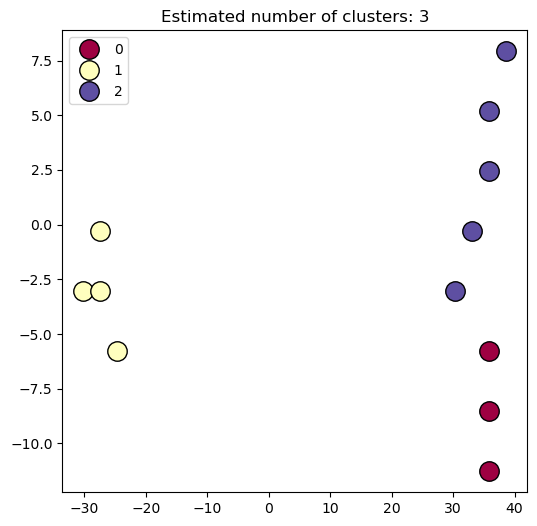

[0 1 2]


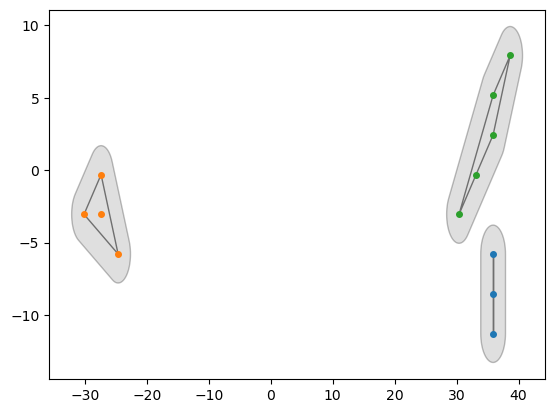

In [98]:
def marks2shapely(df_marks, clust_labels, r=2, show=True):
    """
    df_marks: df with marks for a mice. clustered
    clust_labels: unique labels of clusters
    r: buffer zone radius

    return:
    marks_poly_list: a triplet of 
    [a marker cluster polygon, buffer zone and label of a cluster]
    """
    marks_poly_list = []

    for lab in clust_labels:
        points = df_marks[['x', 'y']].loc[df_marks['cluster']==lab].to_numpy()
        #points = [(xy[0], xy[1]) for xy in points]

        if (sum(points[:,0] == points[0,0]) == len(points) ) or (sum(points[:,1] == points[0,1]) == len(points)) or (len(points) == 2):
            point1, point2 = points[0], points[1]
            point3, point4 = (point1[0], point2[1]), (point2[0], point1[1])
            li = [a for a in points]
            li = li + [point3, point4]
            convex_hull_polygon = Polygon(li)
        else: 
            multi_point = MultiPoint(points)
            convex_hull_polygon = multi_point.convex_hull
        # Create a buffer
        zone_polygon = convex_hull_polygon.buffer(r)
        marks_poly_list.append([convex_hull_polygon, zone_polygon, lab])
        if show:
            x_zone, y_zone = zone_polygon.exterior.xy
            plt.fill(x_zone, y_zone, alpha=0.25, linewidth=1, linestyle='-',
                    edgecolor='black', facecolor='gray', label='Zone Polygon')

            x, y = convex_hull_polygon.exterior.xy
            plt.fill(x, y, alpha=0.5, linewidth=1, linestyle='-',
                    facecolor='none', edgecolor='black', label='')
            plt.plot(*zip(*points), marker='o', ls='',
                    markersize=4.)
    if show:       
        plt.show()
    
    return marks_poly_list

df_marks = clustered_marks[4]
#df_marks = df_marks.loc[df_marks['cluster']!=0]
X = df_marks[['x', 'y']].to_numpy()
c = df_marks['cluster'].to_numpy()
plot_marks_clusters(X, c)
print(np.unique(c))
clust_labels = np.unique(c)
marks_poly_list = marks2shapely(df_marks, clust_labels)

In [111]:
#dfs_divide[4].to_numpy().max()

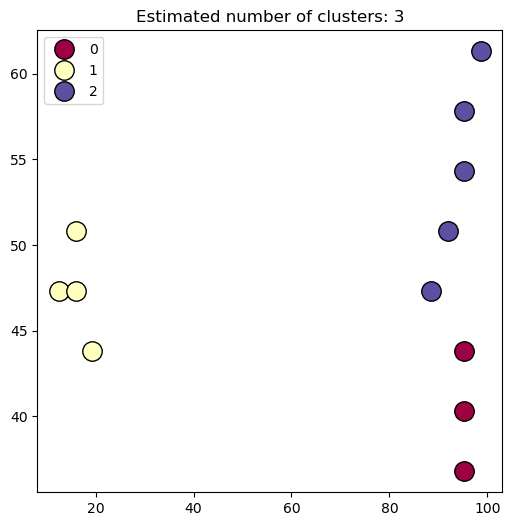

[0 1 2]


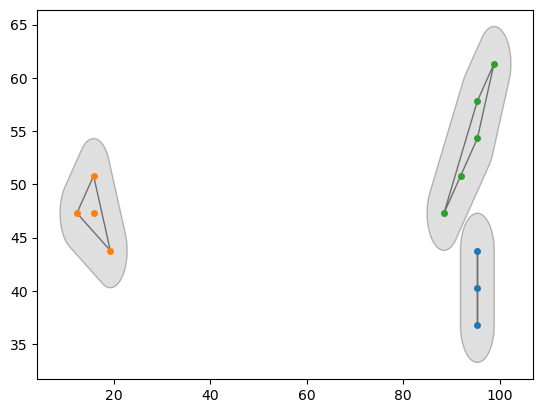

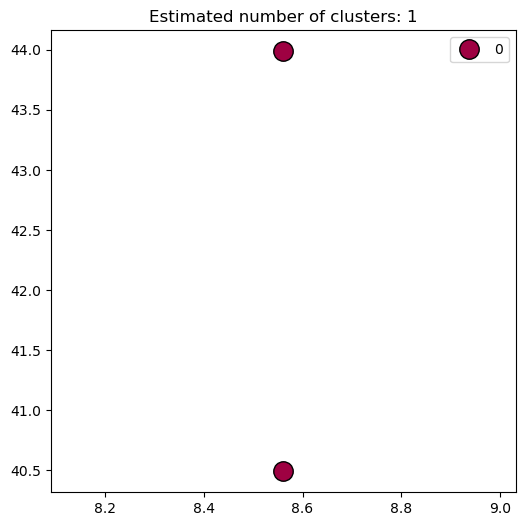

[0]


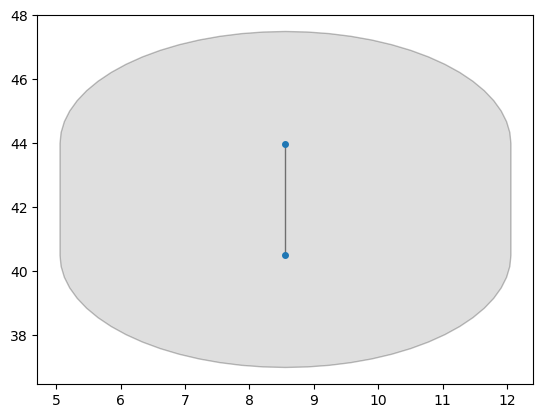

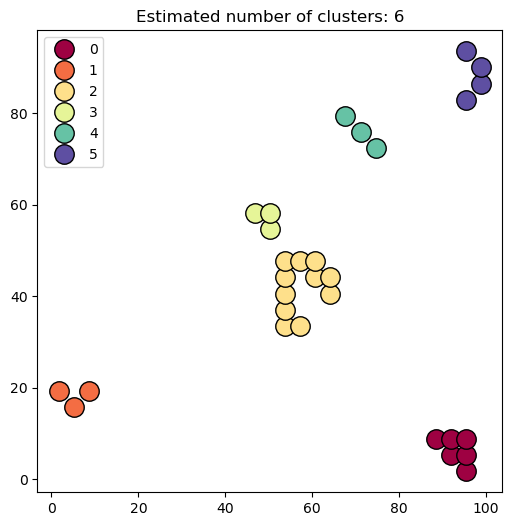

[0 1 2 3 4 5]


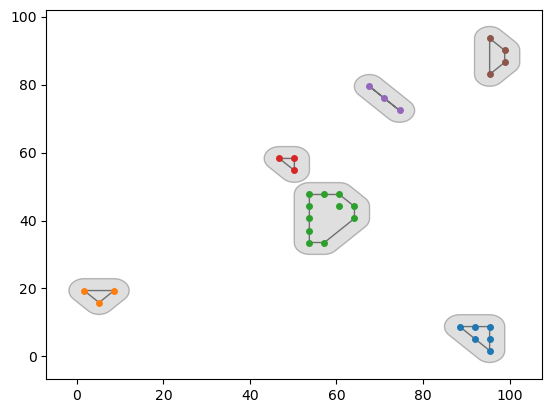

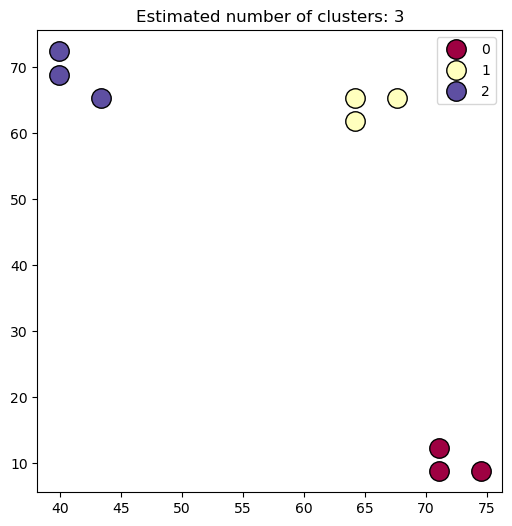

[0 1 2]


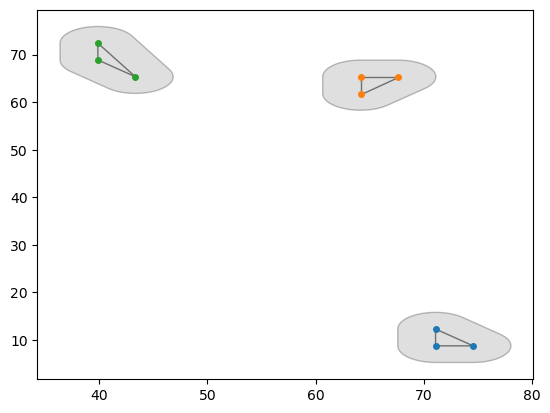

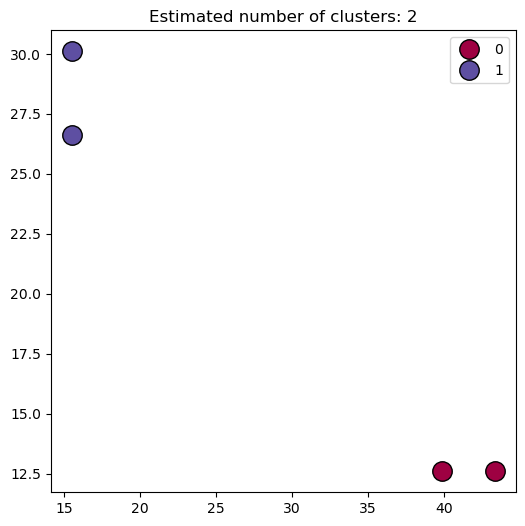

[0 1]


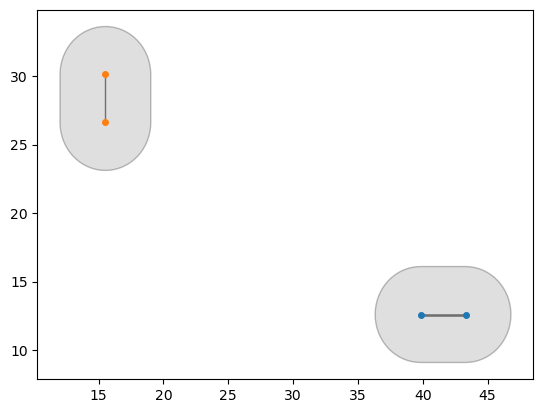

In [188]:
all_polygons = {}
for i in clustered_marks:
    df_marks = clustered_marks[i]
    X = df_marks[['x', 'y']].to_numpy()
    c = df_marks['cluster'].to_numpy()
    plot_marks_clusters(X, c)
    print(np.unique(c))
    clust_labels = np.unique(c)
    marks_poly_list = marks2shapely(df_marks, clust_labels)
    all_polygons[i] = marks_poly_list

In [176]:
clustered_marks

{4:             x          y  coeff  cluster
 0   95.336078  36.772415  0.184        0
 1   95.336078  40.279430  0.248        0
 2   19.321313  43.786445  0.200        1
 3   95.336078  43.786445  0.205        0
 4   12.410880  47.293460  0.191        1
 5   15.866096  47.293460  0.211        1
 6   88.425645  47.293460  0.261        2
 7   15.866096  50.800475  0.286        1
 8   91.880861  50.800475  0.196        2
 9   95.336078  54.307490  0.262        2
 10  95.336078  57.814505  0.238        2
 11  98.791294  61.321520  0.321        2,
 5:           x          y  coeff  cluster
 0  8.560958  40.493207  0.416        0
 1  8.560958  43.987957  0.464        0,
 11:             x          y  coeff  cluster
 0   95.402669   1.716011  1.272        0
 1   91.929845   5.250516  1.155        0
 2   95.402669   5.250516  1.102        0
 3   88.457021   8.785022  0.984        0
 4   91.929845   8.785022  1.086        0
 5   95.402669   8.785022  1.223        0
 6    5.109237  15.854034  0

In [189]:
all_polygons

{4: [[<POLYGON ((95.336 36.772, 95.336 40.279, 95.336 43.786, 95.336 40.279, 95.33...>,
   <POLYGON ((98.836 36.772, 98.819 36.429, 98.769 36.09, 98.685 35.756, 98.57 ...>,
   0],
  [<POLYGON ((19.321 43.786, 12.411 47.293, 15.866 50.8, 19.321 43.786))>,
   <POLYGON ((22.461 45.333, 22.6 45.012, 22.706 44.679, 22.778 44.337, 22.815 ...>,
   1],
  [<POLYGON ((88.426 47.293, 95.336 57.815, 98.791 61.322, 95.336 54.307, 88.42...>,
   <POLYGON ((90.919 44.837, 90.666 44.605, 90.392 44.398, 90.099 44.219, 89.78...>,
   2]],
 5: [[<POLYGON ((8.561 40.493, 8.561 43.988, 8.561 43.988, 8.561 40.493))>,
   <POLYGON ((12.061 40.493, 12.044 40.15, 11.994 39.81, 11.91 39.477, 11.795 3...>,
   0]],
 11: [[<POLYGON ((95.403 1.716, 91.93 5.251, 88.457 8.785, 95.403 8.785, 95.403 1.7...>,
   <POLYGON ((98.903 1.716, 98.886 1.372, 98.835 1.031, 98.751 0.696, 98.634 0....>,
   0],
  [<POLYGON ((5.109 15.854, 1.636 19.389, 8.582 19.389, 5.109 15.854))>,
   <POLYGON ((7.606 13.401, 7.35 13.166, 7.073 12.95

In [187]:
marks_poly_list[0]

[<POLYGON ((95.336 36.772, 95.336 40.279, 95.336 43.786, 95.336 40.279, 95.33...>,
 <POLYGON ((98.836 36.772, 98.819 36.429, 98.769 36.09, 98.685 35.756, 98.57 ...>,
 0]

### trajectory preprocessing (make for_polygons_basic)

In [146]:
# plt.plot(traj_whole['time'])

In [74]:
#1. add v
traj_whole = add_filtered_V(traj_whole)


In [75]:
#2. add angles and absolute displacements
def add_angles(df):
    dt = df['time'].diff()
    vvx = df['x'].diff() / dt 
    vvy = df['y'].diff() / dt 
    dt[0], vvx[0], vvy[0] = 0., 0., 0.

    Xx = np.arctan2(vvx, vvy)
    Nres = normalize_angles_2pi(Xx)
    ang = np.rad2deg(Nres) % 360
    df['angles'] = ang
    return df

# def add_delta_angles(df):
#     dangles = df['angles'].diff()
#     dangles[0] = 0.
#     dangles_rad = np.deg2rad(dangles)
#     normed_dangels_rad = normalize_angles_2pi(dangles_rad)
#     df['delta_angle'] = np.rad2deg(normed_dangels_rad) % 360
#     return df


def add_step_length(df):
    dx = df['x'].diff()
    dy = df['y'].diff()
    dx[0], dy[0] = 0., 0.,
    step_lens = (dx**2 + dy**2)**0.5
    df['step_length'] = step_lens
    return df

df_step = add_step_length(traj_whole)
df_ang = add_angles(df_step)



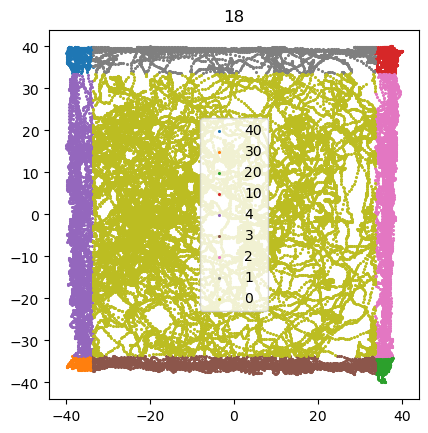

In [76]:
#3. add angles and absolute displacements
wall_perc = 0.08
def sort_walls_area(tr, border_tr, wall_percent=0.1): 
    ylen = border_tr['ymax'] - border_tr['ymin'] 
    xlen = border_tr['xmax'] - border_tr['xmin'] 
    xl = border_tr['xmin'] + xlen * wall_percent
    xr = border_tr['xmax'] - xlen * wall_percent
    yd = border_tr['ymin'] + ylen * wall_percent
    yu = border_tr['ymax'] - ylen * wall_percent

    tr['near_wall'] = 0.
    for i in range(len(tr)):     
        if tr['x'].iloc[i] < xl:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 40
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 30
            else:
                tr['near_wall'].iloc[i] = 4
        elif tr['x'].iloc[i] > xr:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 10
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 20
            else:
                tr['near_wall'].iloc[i] = 2
        elif tr['y'].iloc[i] > yu:
            tr['near_wall'].iloc[i] = 1
        elif tr['y'].iloc[i] < yd:
            tr['near_wall'].iloc[i] = 3
    return tr

def plot_wall_sorted_samples(df, plot_title):
    all_areas = [40, 30, 20, 10, 4, 3, 2, 1, 0]
    for a in all_areas:
        x = df.loc[df['near_wall'] == a]['x']
        y = df.loc[df['near_wall'] == a]['y']
        plt.scatter(x, y, s=1.5, label=str(a))
    plt.gca().set_aspect('equal')
    plt.title(plot_title)
    plt.legend(loc='center')
    plt.show()


#bord100 =  {'xmin': 0,'xmax': 100,'ymin': 0,'ymax': 100}
bord_real =  {'xmin': df_ang['x'].min(),'xmax': df_ang['x'].max(),'ymin': df_ang['y'].min(),'ymax': df_ang['y'].max()}   

df_with_walls = sort_walls_area(df_ang, bord_real, wall_perc)
plot_wall_sorted_samples(df_with_walls, k)

In [77]:
ldf = df_with_walls.iloc[1:]
#first row of ldf does not have step length
s_r = (ldf['time'].max() - ldf['time'].min())/ len(ldf)
window_size = round(0.5/s_r)
if len(ldf) >= window_size:
    ldf['step_sum_0.5'] = ldf['step_length'].rolling(window_size).sum()
    ldf['step_sum_0.5']=ldf['step_sum_0.5'].fillna(-100)
    dfs_step_sum = ldf

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\261054425.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ldf['step_sum_0.5'] = ldf['step_length'].rolling(window_size).sum()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\261054425.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ldf['step_sum_0.5']=ldf['step_sum_0.5'].fillna(-100)


In [159]:
# df_with_walls2 = sort_walls_area(df_ang, bord100, 0.08)
# plot_wall_sorted_samples(df_with_walls2, k)

In [197]:
# df_with_walls3 = sort_walls_area(df_ang, bord100, 0.05)
# plot_wall_sorted_samples(df_with_walls3, k)

In [78]:
with open('neuro_preprocessed_dataset/mouse3/neuro_m3_for_polygons_basic.pkl', 'wb') as fp:    
    pickle.dump(dfs_step_sum, fp)

### shapely, part 2: based on marks cluster analysis

##### open preprocesses data

In [94]:
DIR = 'neuro_preprocessed_dataset/mouse3'

# load traj
fname = f'{DIR}/neuro_m3_for_polygons_basic.pkl'
with open(fname, 'rb') as f:
    dfs_step_sum = pickle.load(f)

In [93]:
mname = f'{DIR}/clustered_marks_30bin.pkl'
with open(mname, 'rb') as f:
    clustered_marks = pickle.load(f)

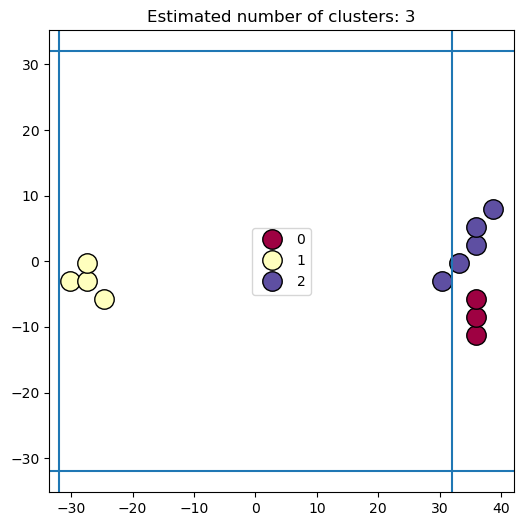

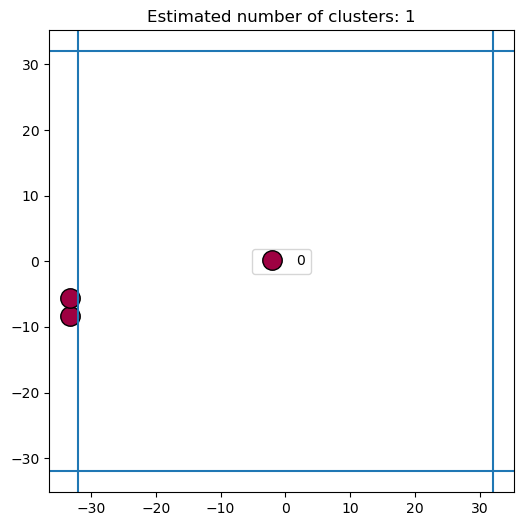

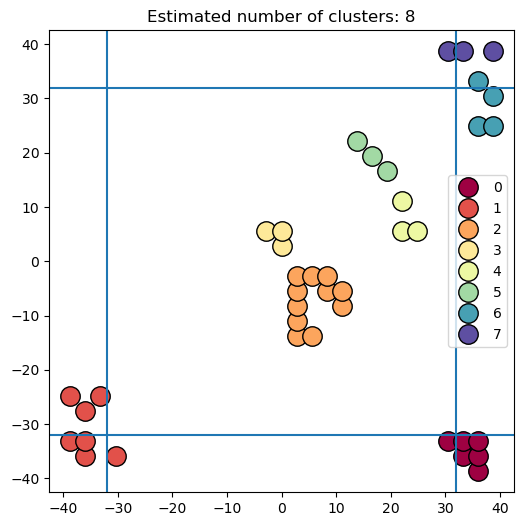

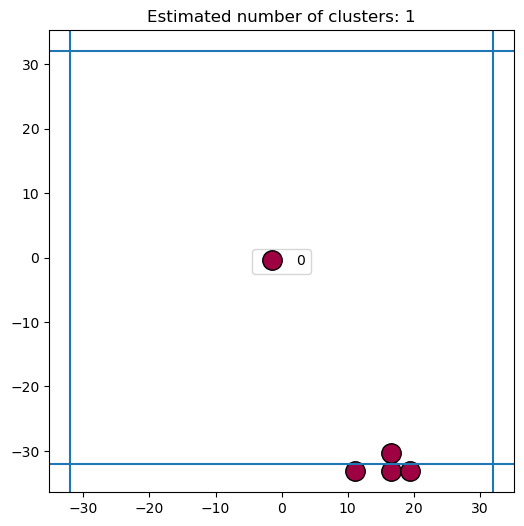

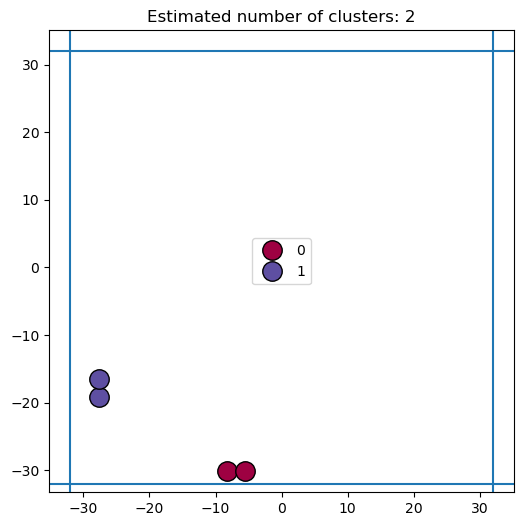

In [95]:
#can be skipped
# open marks, classify them for center, walls, corners manually
for k in clustered_marks:
    m = clustered_marks[k]
    X = m[['x', 'y']].to_numpy()
    c = m['cluster'].to_numpy()
    plot_marks_clusters(X, c, areas=True, lmin=-40, lmax=40)
#i think there is no need to fix these clusters

##### plot polygons, compute kappa

In [96]:
from shapely.geometry import LineString, MultiLineString
from shapely.geometry import MultiPoint, Polygon, Point
from utils.plotting import plot_trajectory
import shapely
import matplotlib


def marks2shapely(df_marks, clust_labels, r=2, show=True):
    """
    df_marks: df with marks for a mice. clustered
    clust_labels: unique labels of clusters
    r: buffer zone radius

    return:
    marks_poly_list: a triplet of 
    [a marker cluster polygon, buffer zone and label of a cluster]
    """
    marks_poly_list = []
    # cmap = matplotlib.cm.get_cmap('tab20')
    cmap = matplotlib.cm.get_cmap('tab20')
    colors = cmap(clust_labels)

    for idx, lab in enumerate(clust_labels):
        points = df_marks[['x', 'y']].loc[df_marks['cluster']==lab].to_numpy()
        points = [(xy[0], xy[1]) for xy in points]

        if len(points) == 2:
            point1, point2 = points[0], points[1]
            point3, point4 = (point1[0], point2[1]), (point2[0], point1[1])
            convex_hull_polygon = Polygon([point1, point3,
                                           point2, point4])
        elif len(points) == 1:
            convex_hull_polygon = Point(points)
        else: 
            multi_point = MultiPoint(points)
            convex_hull_polygon = multi_point.convex_hull
            
        # Create a buffer
        zone_polygon = convex_hull_polygon.buffer(r)
        marks_poly_list.append([convex_hull_polygon, zone_polygon, lab])
        if show:
            x_zone, y_zone = zone_polygon.exterior.xy
            plt.fill(x_zone, y_zone, alpha=0.75, linewidth=1, linestyle='-',
                    edgecolor='black', label=lab, color=colors[idx])
            
            if type(convex_hull_polygon) == LineString:
                coord = shapely.get_coordinates(convex_hull_polygon)
                x, y = coord[:, 0], coord[:, 1]
            elif type(convex_hull_polygon) == Point:
                x, y = convex_hull_polygon.x, convex_hull_polygon.y
            else:
                x, y = convex_hull_polygon.exterior.xy

            plt.fill(x, y, alpha=0.5, linewidth=1, linestyle='-',
                    facecolor='none', edgecolor='black', label='')
            
    # color the points wrt mark strength
    x_, y_ = df_marks['x'], df_marks['y']
    color = df_marks['coeff'].to_numpy()
    plt.scatter(x_, y_, c=color, cmap='Greys', s=22)
    plt.colorbar()
    plt.legend()
    for vline in [-40, 40]:
        plt.axvline(vline, alpha=0.35, zorder=0, color='grey')     
        plt.axhline(vline, alpha=0.35, zorder=0, color='grey')     
    plt.show()
    
    return marks_poly_list


def marks2shapely_upd(df_marks, clust_labels, r=2, show=True):
    """
    df_marks: df with marks for a mice. clustered
    clust_labels: unique labels of clusters
    r: buffer zone radius

    return:
    marks_poly_list: a triplet of 
    [a marker cluster polygon, buffer zone and label of a cluster]
    """
    marks_poly_list = []

    for lab in clust_labels:
        points = df_marks[['x', 'y']].loc[df_marks['cluster']==lab].to_numpy()
        #points = [(xy[0], xy[1]) for xy in points]

        if (sum(points[:,0] == points[0,0]) == len(points) ) or (sum(points[:,1] == points[0,1]) == len(points)) or (len(points) == 2):
            point1, point2 = points[0], points[1]
            point3, point4 = (point1[0], point2[1]), (point2[0], point1[1])
            li = [a for a in points]
            li = li + [point3, point4]
            convex_hull_polygon = Polygon(li)
        else: 
            multi_point = MultiPoint(points)
            convex_hull_polygon = multi_point.convex_hull
        # Create a buffer
        zone_polygon = convex_hull_polygon.buffer(r)
        marks_poly_list.append([convex_hull_polygon, zone_polygon, lab])
        if show:
            x_zone, y_zone = zone_polygon.exterior.xy
            plt.fill(x_zone, y_zone, alpha=0.25, linewidth=1, linestyle='-',
                    edgecolor='black', facecolor='gray', label='Zone Polygon')

            x, y = convex_hull_polygon.exterior.xy
            plt.fill(x, y, alpha=0.5, linewidth=1, linestyle='-',
                    facecolor='none', edgecolor='black', label='')
            plt.plot(*zip(*points), marker='o', ls='',
                    markersize=4.)
    if show:       
        plt.show()
    
    return marks_poly_list

4 (12, 4)


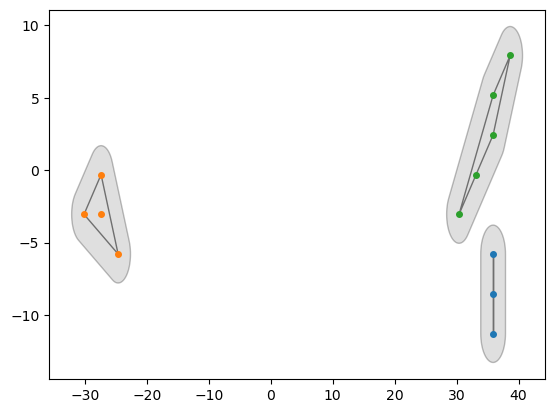

5 (2, 4)


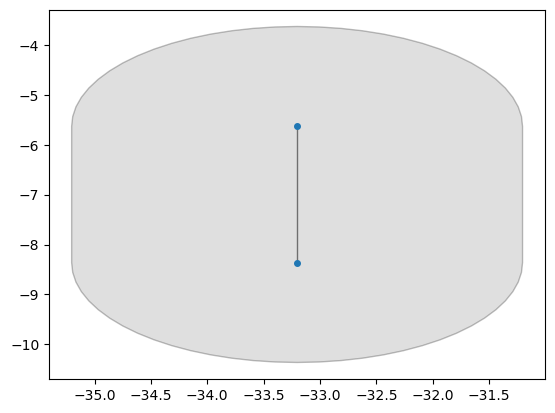

11 (40, 4)


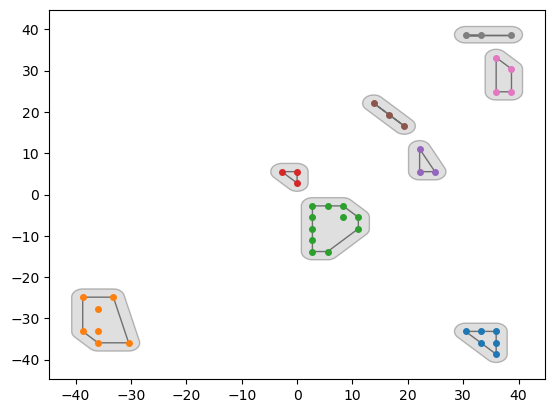

14 (4, 4)


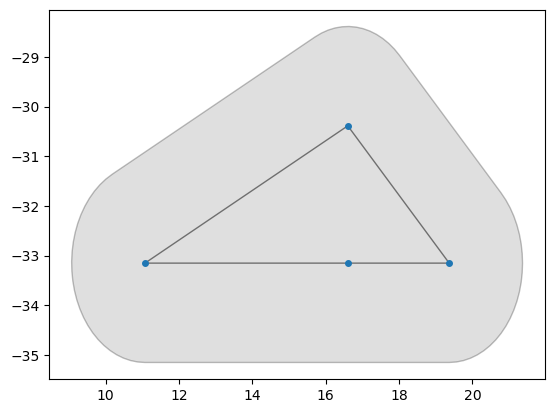

18 (4, 4)


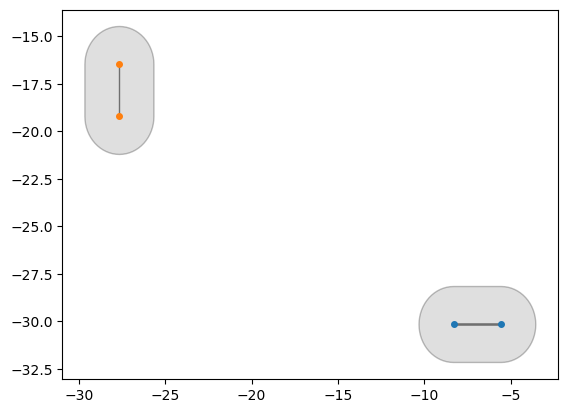

In [99]:
#same as my variable all_polygons
marks_poly_df = {}
for k, df in clustered_marks.items():
    print(k, df.shape)
    c = np.unique(df['cluster'].to_numpy())
    mpoly = marks2shapely(df, c, show=True)
    marks_poly_df[k] = mpoly

In [103]:
# Manually make polygons without marks for comparison
from utils.shapely_funcs import plot_shapely_mark, plot_shapely_traj

# Create affinity transform function
def move(poly, xmove, ymove): ### TODO:
    if type(poly) == LineString:
        coord = shapely.get_coordinates(poly)
    elif type(poly) == Point:
        coord = np.array([poly.x, poly.y])
    else:
        coord = np.asarray(poly.exterior.xy)

    xm, ym = coord[0, :] + xmove, coord[1, :] + ymove
    if (any(xm > 40) | any(xm < -40)) | (any(ym > 40) | any(ym < -40)):
        raise ValueError('Out of bounds, should be in range [-40, 40]')

    coordm = Polygon(np.stack([xm, ym]).T)
    return coordm


def vflip(poly):
    if type(poly) == LineString:
        coord = shapely.get_coordinates(poly)
    elif type(poly) == Point:
        coord = np.array([poly.x, poly.y])
    else:
        coord = np.asarray(poly.exterior.xy)

    if coord.shape[1] == 1:
        poly_f = Point(coord)
    elif coord.shape[1] == 2:
        poly_f = LineString(coord)
    else:
        coord = np.asarray(coord).T
        poly_f = Polygon(coord.dot([[1,0],[0,-1]]))
    return poly_f


def hflip(poly):
    if type(poly) == LineString:
        coord = shapely.get_coordinates(poly)
    elif type(poly) == Point:
        coord = np.array([poly.x, poly.y])
    else:
        coord = np.asarray(poly.exterior.xy)

    if coord.shape[1] == 1:
        poly_f = Point(coord)
    elif coord.shape[1] == 2:
        poly_f = LineString(coord)
    else:
        coord = np.asarray(coord).T
        poly_f = Polygon(coord.dot([[-1,0],[0,1]]))
    return poly_f


def to_shapely_traj(traj_df):
    points = traj_df[['x', 'y']].to_numpy()
    trajectory_points = [(xy[0], xy[1]) for xy in points]
    trajectory = LineString(trajectory_points)
    return trajectory


r = 2

In [104]:
### Calculate coeff of strength of marks: 
# kappa_square = sum / square: the density of mark 
# kappa = sum / N_points:      the strength of mark

marks_coeffs = {}
for k, df in clustered_marks.items():
    kappas_dict = {}

    clust_labels = np.unique(df['cluster'].to_numpy())
    for idx, lab in enumerate(clust_labels):
        coeffs = df[['coeff']].loc[df['cluster']==lab].to_numpy()

        kappa = np.sum(coeffs) / coeffs.shape[0]
        
        poly_list = marks_poly_df[k]
        for l in poly_list:
            if l[2] == lab:
                sqrt = l[0].area
                if sqrt == 0:
                    kappa_square = None
                else:
                    kappa_square = np.sum(coeffs) / sqrt

        kappas_dict[lab] = [kappa, kappa_square]
    marks_coeffs[k] = kappas_dict

marks_coeffs[4]

{0: [0.212, None],
 1: [0.22325, 0.07891008436022288],
 2: [0.2694, 0.11902786521077277]}

##### Now lets manually create pairs we want to compare for a trajectory¶

###### cutting a suspiciously even part of trajectory

(1800.0, 1920.0)

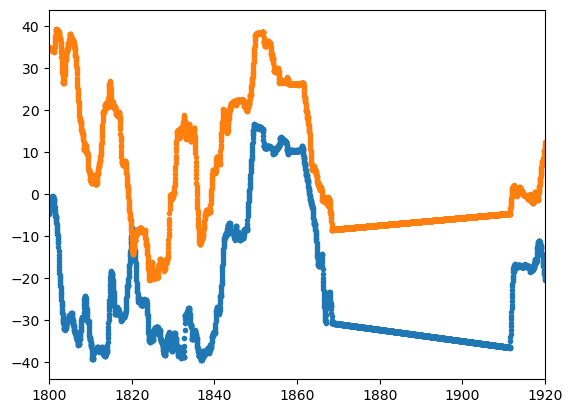

In [224]:
#cutting a suspiciously even part of trajectory

plt.plot(dfs_step_sum['time'],dfs_step_sum['x'], '.')
plt.plot(dfs_step_sum['time'],dfs_step_sum['y'],'.')
plt.xlim(1800, 1920)

(1868.0, 1912.0)

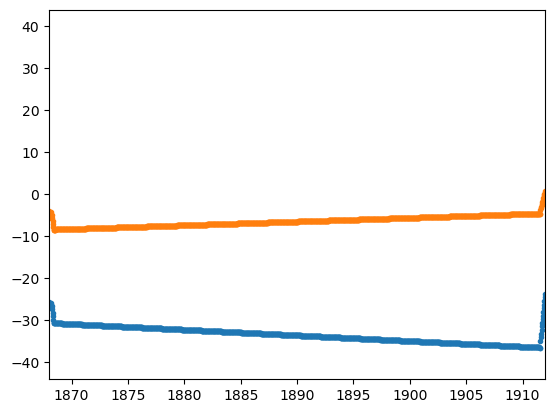

In [225]:
#cutting a suspiciously even part of trajectory

plt.plot(dfs_step_sum['time'],dfs_step_sum['x'], '.')
plt.plot(dfs_step_sum['time'],dfs_step_sum['y'],'.')
plt.xlim(1868, 1912)

In [227]:
dfs_step_sum_cut = dfs_step_sum.loc[(dfs_step_sum['time']<=1868) | (dfs_step_sum['time']>=1912)]

(1800.0, 1920.0)

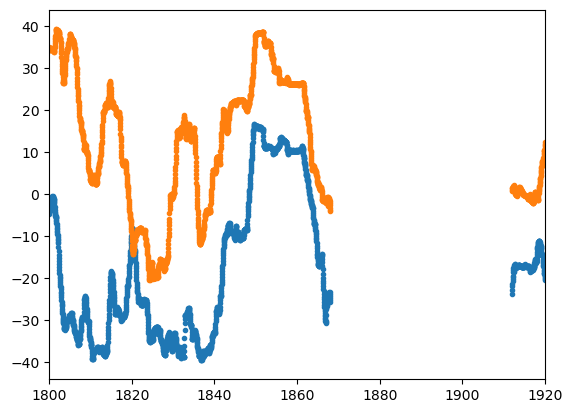

In [230]:
plt.plot(dfs_step_sum_cut['time'],dfs_step_sum_cut['x'], '.')
plt.plot(dfs_step_sum_cut['time'],dfs_step_sum_cut['y'],'.')
plt.xlim(1800, 1920)

##### make dict

In [240]:
dict_compar_lists = {}

###### 4---------------------------------------------------------------------------------------------------------------------

4
3


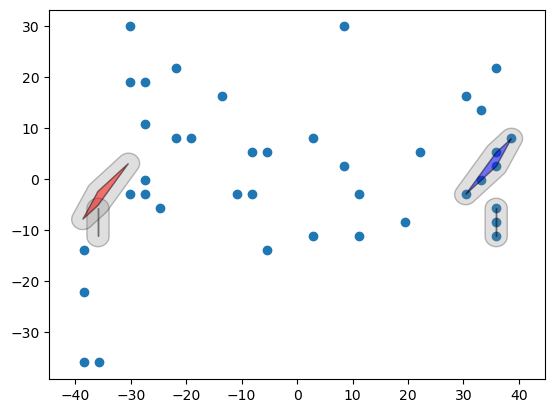

In [329]:
#1. create and plot flipped polygons

r = 2
comparison_list = []

k = 4
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

traj = dfs_step_sum_cut
#plot_shapely_traj(to_shapely_traj(traj))

trN_coords = coords_dict[k]
trN_coords_x = [i[0] for i in trN_coords]
trN_coords_y = [i[1] for i in trN_coords]
plt.scatter(trN_coords_x, trN_coords_y)

#0 polygon - flipped пересекается с 2
poly, buffer, lab = poly_list[0]
poly_f = hflip(poly)
buffer_f = hflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 40],
                        [poly_f, buffer_f, 4011]])

# #1 polygon - такой себе флип
# poly, buffer, lab = poly_list[1]
# poly_f = vflip(poly)
# buffer_f = vflip(buffer)
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                 label='flipped', color='red')
# comparison_list.append()

# #2 polygon
poly, buffer, lab = poly_list[2]
poly_f = vflip(hflip(poly))
buffer_f = vflip(hflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
                label='flipped', color='red')
comparison_list.append([[poly, buffer, 42],
                        [poly_f, buffer_f, 4211]])

dict_compar_lists[k] = comparison_list

In [335]:
big_dict_inter = {}
big_dict_buff = {}

In [327]:
%matplotlib inline

4
3


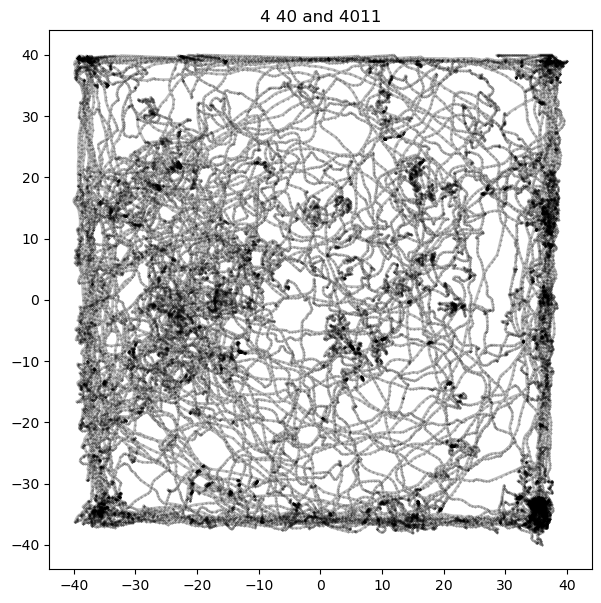

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


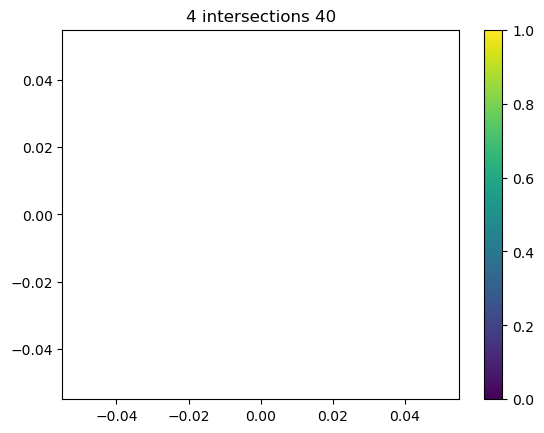

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


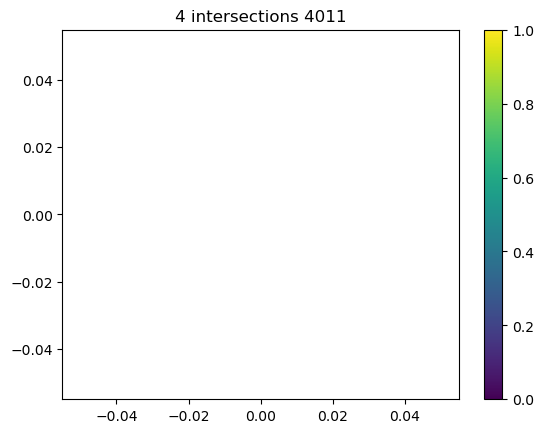

Unique intersecting points in DataFrame: 761
Total ratio: 0.013


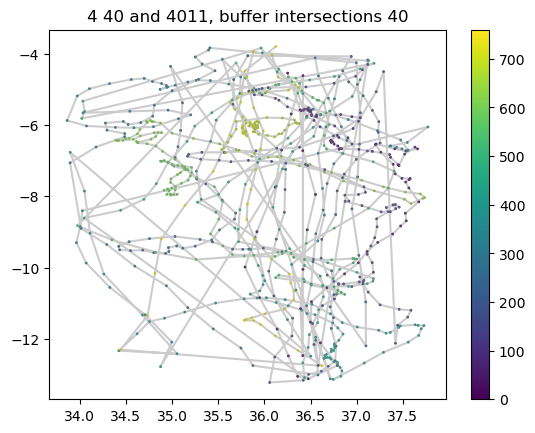

Unique intersecting points in DataFrame: 409
Total ratio: 0.007


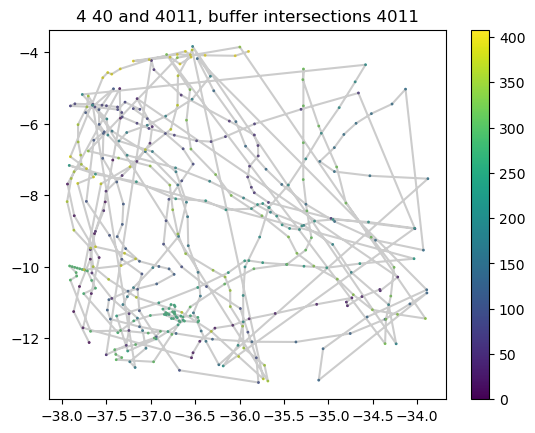

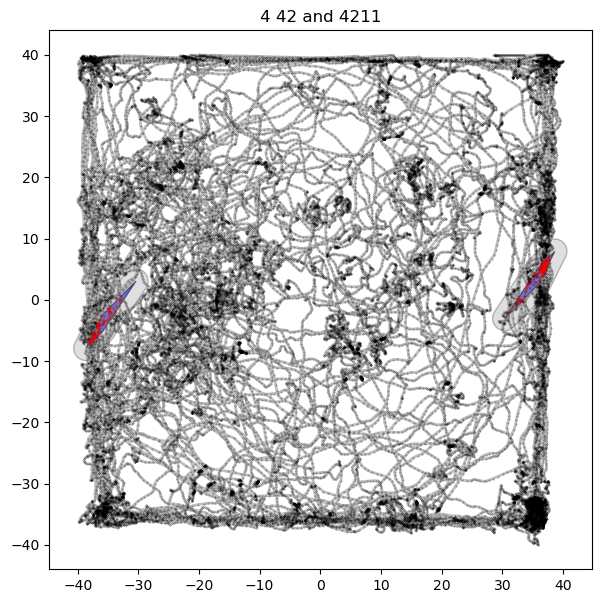

Unique intersecting points in DataFrame: 156
Total ratio: 0.003


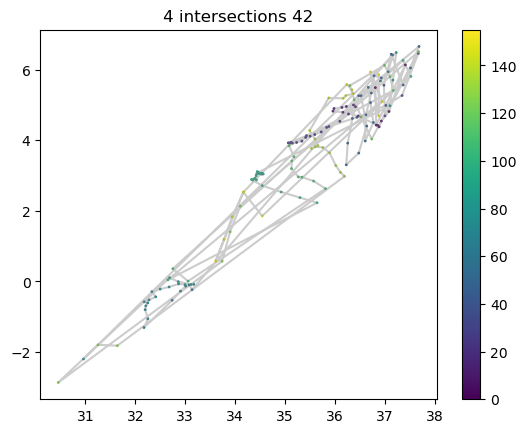

Unique intersecting points in DataFrame: 85
Total ratio: 0.001


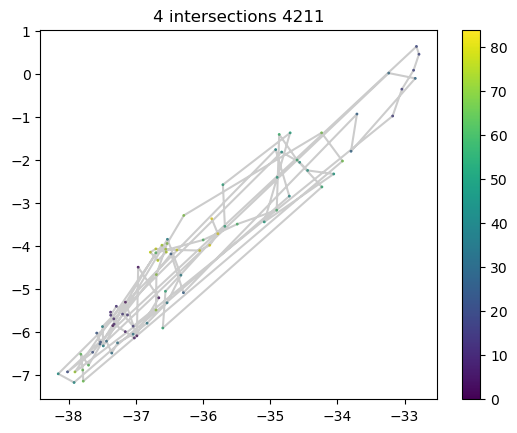

Unique intersecting points in DataFrame: 1092
Total ratio: 0.019


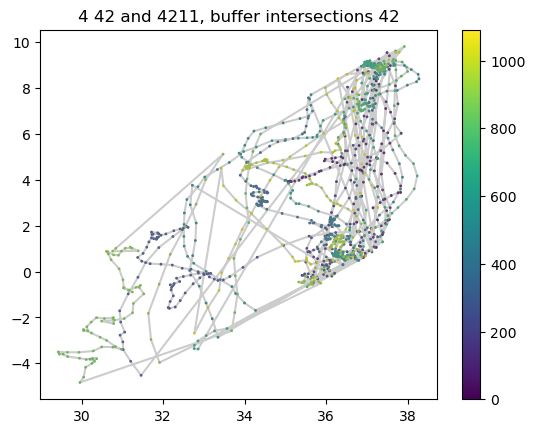

Unique intersecting points in DataFrame: 666
Total ratio: 0.012


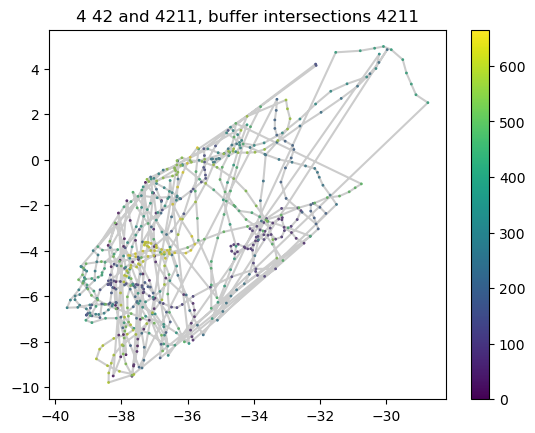

In [336]:
#2. find intersections with polygons, polygon buffers

r = 2

k = 4
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

dict_inter = {}
dict_buff = {}
polygon_names = []

# Calculate trajectory parts intersected with marks

#for comparison_pair in comparison_list:
for i in range(len(comparison_list)):
    comparison_pair = comparison_list[i]
    traj = dfs_step_sum_cut
    name_i = comparison_list[i][0][2]
    name_i_f = comparison_list[i][1][2]

    # for marks
    inters = find_traj_marks_intersections(tr=traj.copy(),
                                           marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
    df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
                                                      marks_interections=inters,
                                                      buff=False, title=str(k)+' intersections')
    df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
                                                                marks_interections=inters,
                                                                buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
    dict_inter[name_i] = tr_new
    dict_buff[name_i] = tr_new_buff
    polygon_names.append(name_i)
    #break

# форма распределения длины шагов, форма распределения углов поворота
# количество сэмплов остановки, кол-во сэмплов бега
big_dict_inter[k] = dict_inter
big_dict_buff[k] = dict_buff


In [338]:
marks_poly_df.keys()

dict_keys([4, 5, 11, 14, 18])

###### 5---------------------------------------------------------------------------------------------------------------------

5
1


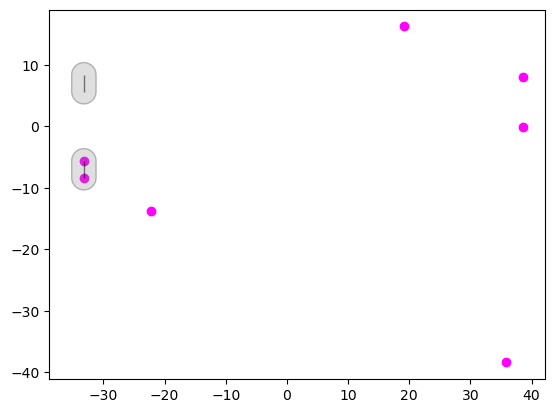

In [341]:
comparison_list = []

k = 5
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

traj = dfs_step_sum_cut
#plot_shapely_traj(to_shapely_traj(traj))

trN_coords = coords_dict[k]
trN_coords_x = [i[0] for i in trN_coords]
trN_coords_y = [i[1] for i in trN_coords]
plt.scatter(trN_coords_x, trN_coords_y, c='magenta')

#0 polygon
poly, buffer, lab = poly_list[0]
poly_f = vflip(poly)
buffer_f = vflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 50],
                        [poly_f, buffer_f, 5011]])


dict_compar_lists[k] = comparison_list

In [343]:
polygon_names

[50]

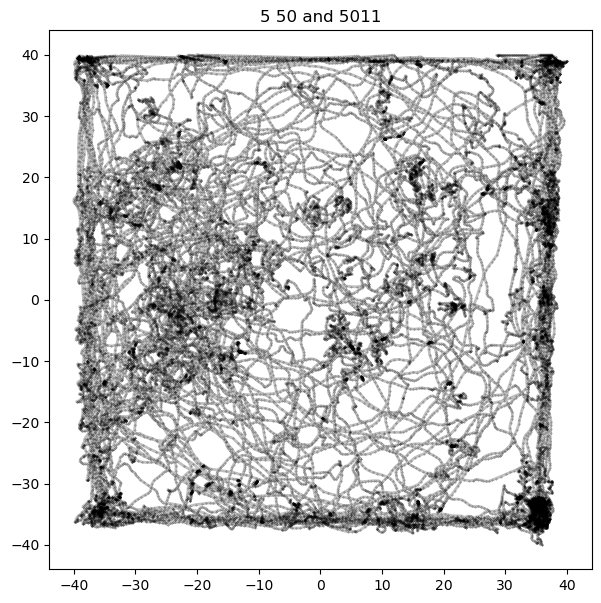

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


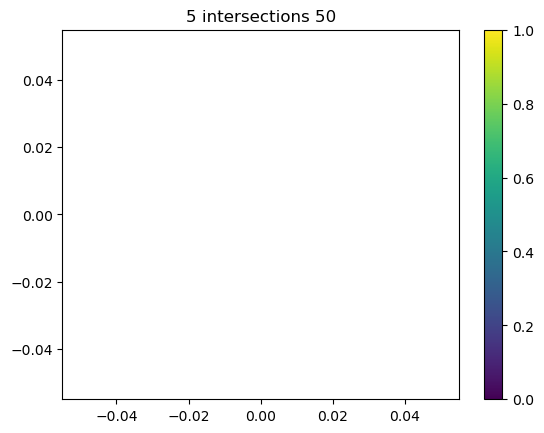

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


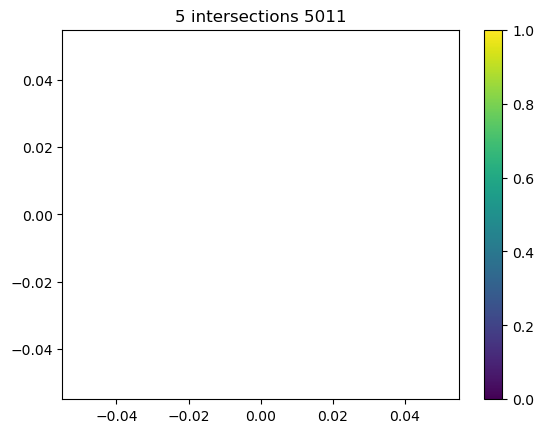

Unique intersecting points in DataFrame: 128
Total ratio: 0.002


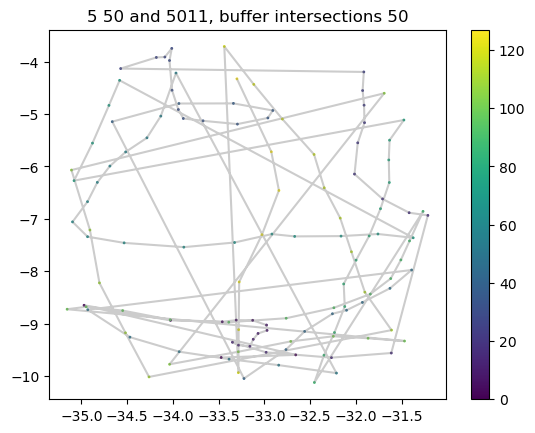

Unique intersecting points in DataFrame: 233
Total ratio: 0.004


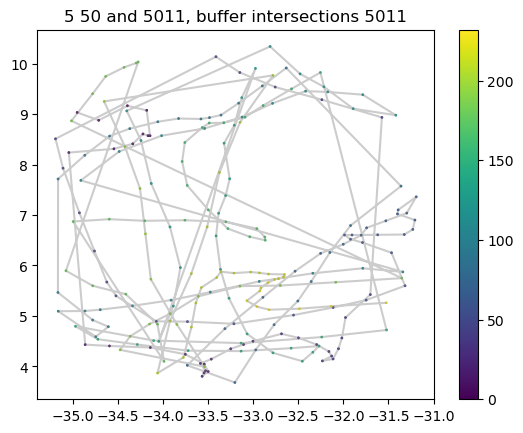

In [345]:
#2. find intersections with polygons, polygon buffers

dict_inter = {}
dict_buff = {}
polygon_names = []

# Calculate trajectory parts intersected with marks

#for comparison_pair in comparison_list:
for i in range(len(comparison_list)):
    comparison_pair = comparison_list[i]
    traj = dfs_step_sum_cut
    name_i = comparison_list[i][0][2]
    name_i_f = comparison_list[i][1][2]

    # for marks
    inters = find_traj_marks_intersections(tr=traj.copy(),
                                           marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
    df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
                                                      marks_interections=inters,
                                                      buff=False, title=str(k)+' intersections')
    df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
                                                                marks_interections=inters,
                                                                buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
    dict_inter[name_i] = tr_new
    dict_buff[name_i] = tr_new_buff
    polygon_names.append(name_i)
    #break

# форма распределения длины шагов, форма распределения углов поворота
# количество сэмплов остановки, кол-во сэмплов бега
big_dict_inter[k] = dict_inter
big_dict_buff[k] = dict_buff


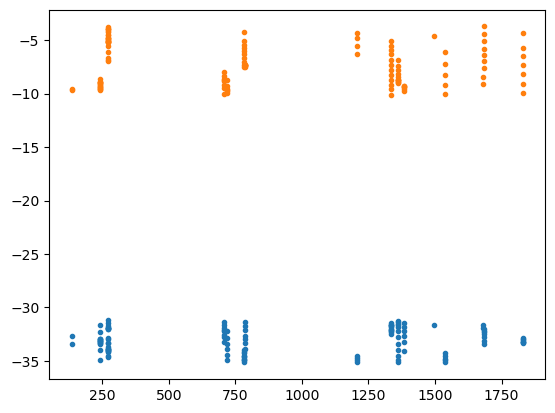

In [349]:
plt.plot(tr_new.loc[tr_new_buff['intersection']==50]['time'],tr_new.loc[tr_new_buff['intersection']==50]['x'], '.')
plt.plot(tr_new.loc[tr_new_buff['intersection']==50]['time'],tr_new.loc[tr_new_buff['intersection']==50]['y'],'.')

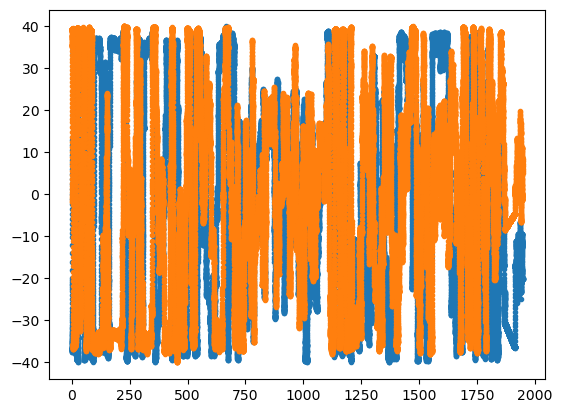

In [350]:
plt.plot(dfs_step_sum['time'],dfs_step_sum['x'], '.')
plt.plot(dfs_step_sum['time'],dfs_step_sum['y'],'.')

###### 11---------------------------------------------------------------------------------------------------------------------

11
8


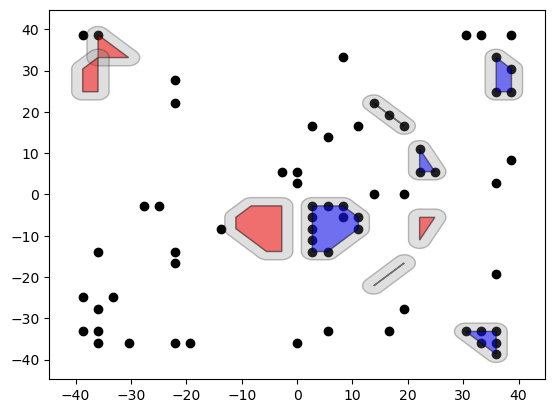

In [353]:
comparison_list = []

k = 11
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

traj = dfs_step_sum_cut
#plot_shapely_traj(to_shapely_traj(traj))

trN_coords = coords_dict[k]
trN_coords_x = [i[0] for i in trN_coords]
trN_coords_y = [i[1] for i in trN_coords]
plt.scatter(trN_coords_x, trN_coords_y, color='black')

#0 polygon - flipped пересекается с точкой
poly, buffer, lab = poly_list[0]
poly_f = hflip(vflip(poly))
buffer_f = hflip(vflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 110],
                        [poly_f, buffer_f, 11011]])

#1 polygon -  не с чем сравнивать
# poly, buffer, lab = poly_list[1]
# poly_f = hflip(vflip(poly))
# buffer_f = hflip(vflip(buffer))
# plot_shapely_mark(poly, buffer)
# # plot_shapely_mark(poly_f, buffer_f,
# #                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 111],
#                         [poly_f, buffer_f, 11111]])

#2 polygon
poly, buffer, lab = poly_list[2]
poly_f = hflip(poly)
buffer_f = hflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 112],
                        [poly_f, buffer_f, 11211]])

#3 polygon - не с чем сравнивать
# poly, buffer, lab = poly_list[3]
# poly_f = vflip(poly)
# buffer_f = vflip(buffer)
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 113],
#                         [poly_f, buffer_f, 11311]])

#4 polygon
poly, buffer, lab = poly_list[4]
poly_f = vflip(poly)
buffer_f = vflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 114],
                        [poly_f, buffer_f, 11411]])
#5 polygon
poly, buffer, lab = poly_list[5]
poly_f = vflip(poly)
buffer_f = vflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 115],
                        [poly_f, buffer_f, 11511]])
#6 polygon
poly, buffer, lab = poly_list[6]
poly_f = hflip(poly)
buffer_f = hflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 116],
                        [poly_f, buffer_f, 11611]])

#7 polygon - плохо отражается
# poly, buffer, lab = poly_list[7]
# poly_f = vflip(hflip(poly))
# buffer_f = vflip(hflip(buffer))
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 117],
#                         [poly_f, buffer_f, 11711]])


dict_compar_lists[k] = comparison_list

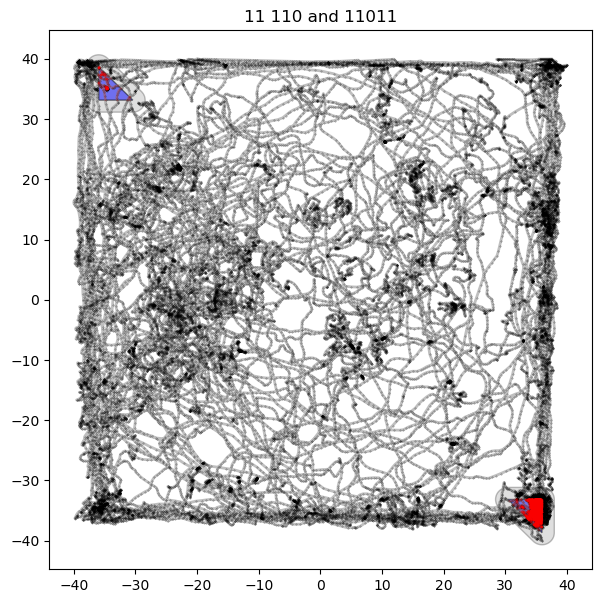

Unique intersecting points in DataFrame: 2242
Total ratio: 0.039


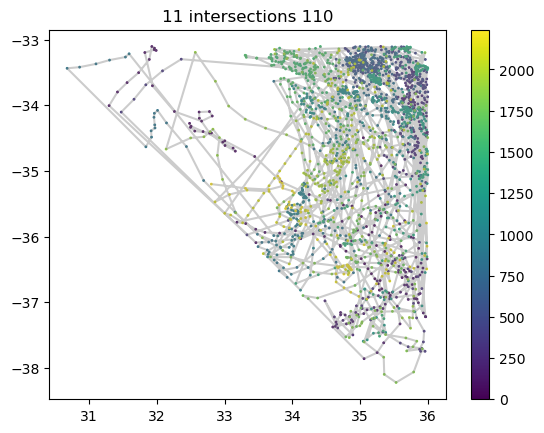

Unique intersecting points in DataFrame: 136
Total ratio: 0.002


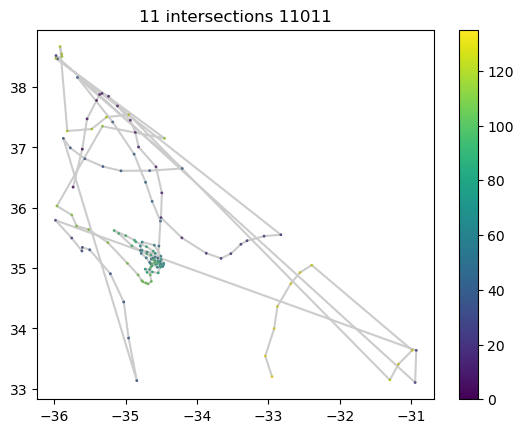

Unique intersecting points in DataFrame: 5053
Total ratio: 0.088


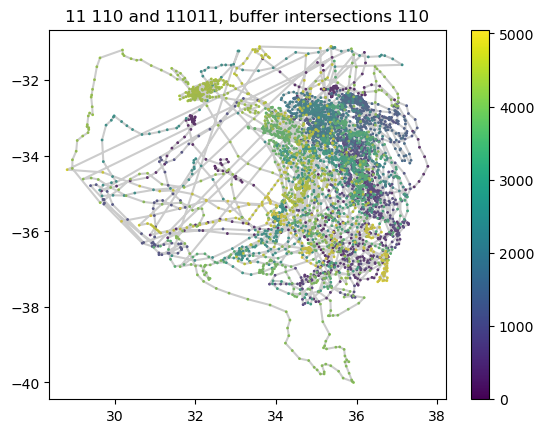

Unique intersecting points in DataFrame: 819
Total ratio: 0.014


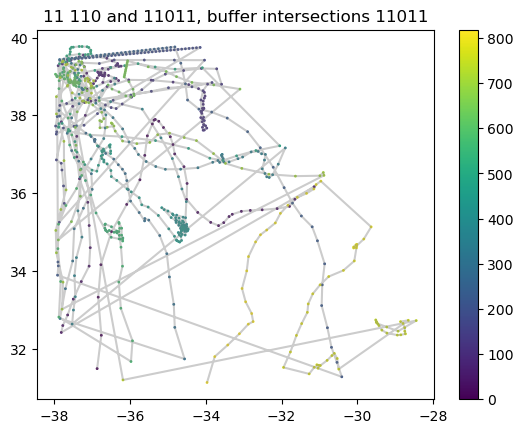

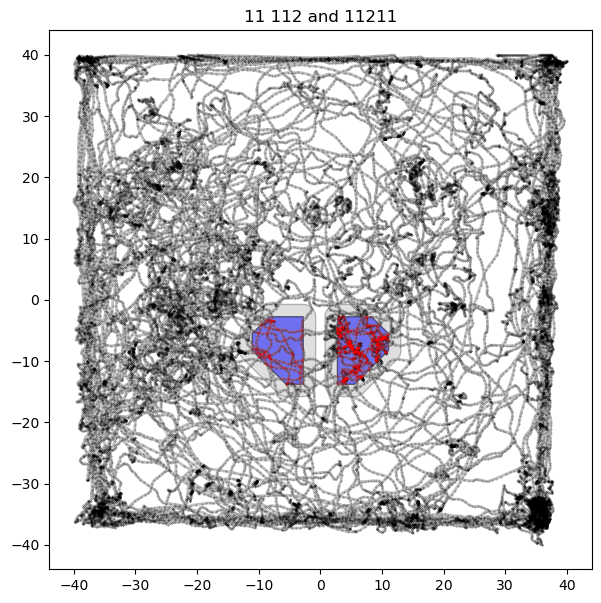

Unique intersecting points in DataFrame: 1274
Total ratio: 0.022


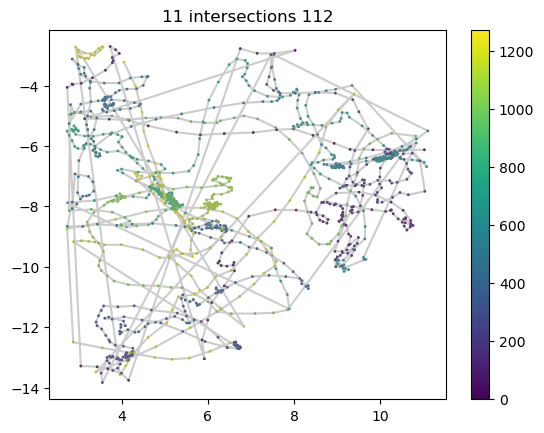

Unique intersecting points in DataFrame: 229
Total ratio: 0.004


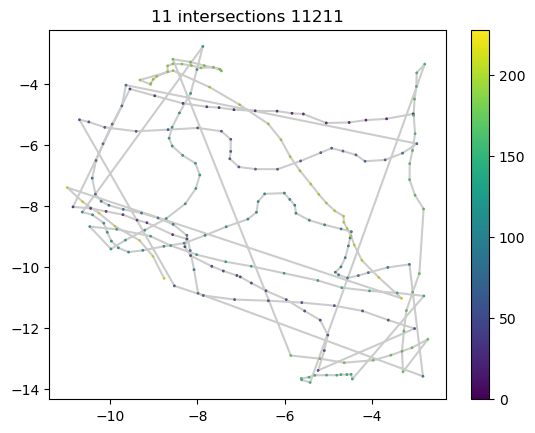

Unique intersecting points in DataFrame: 1892
Total ratio: 0.033


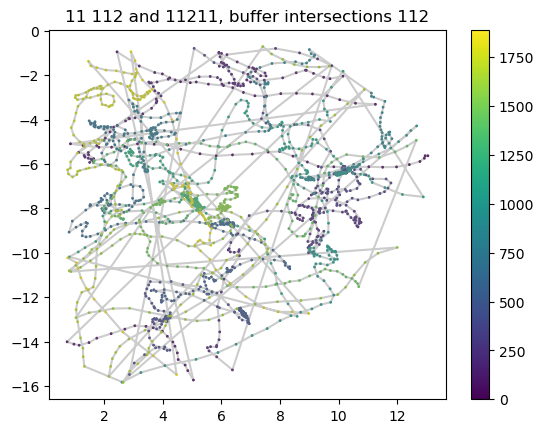

Unique intersecting points in DataFrame: 569
Total ratio: 0.01


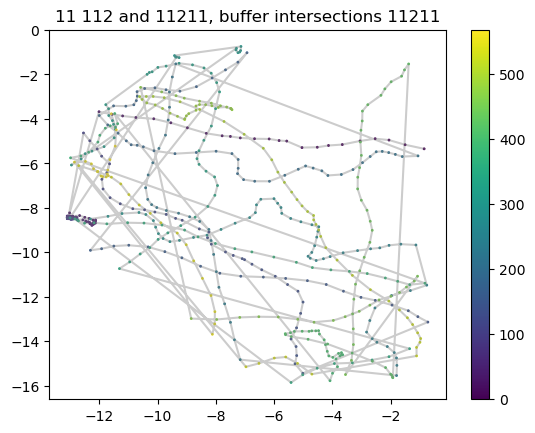

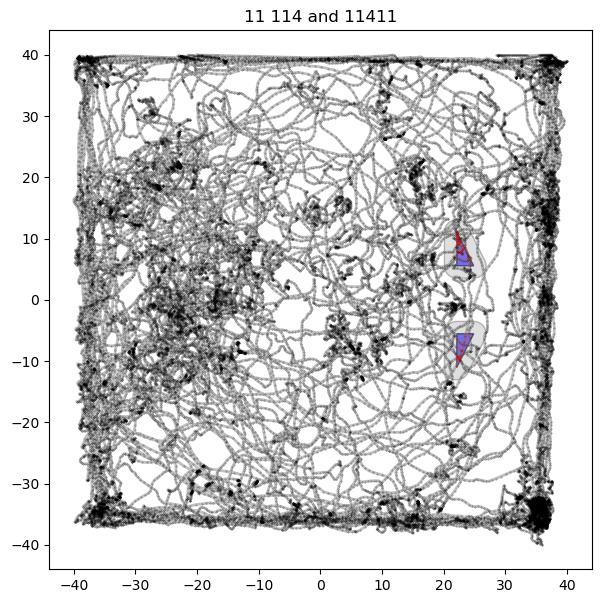

Unique intersecting points in DataFrame: 65
Total ratio: 0.001


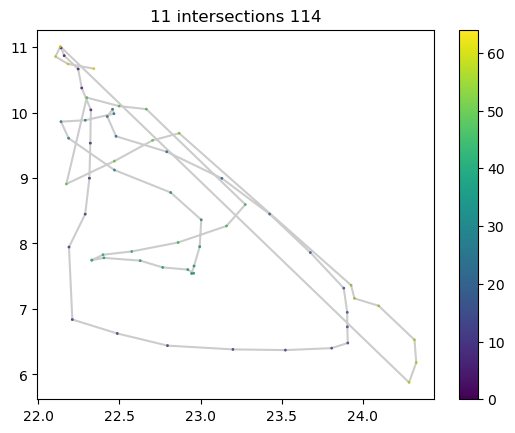

Unique intersecting points in DataFrame: 21
Total ratio: 0.0


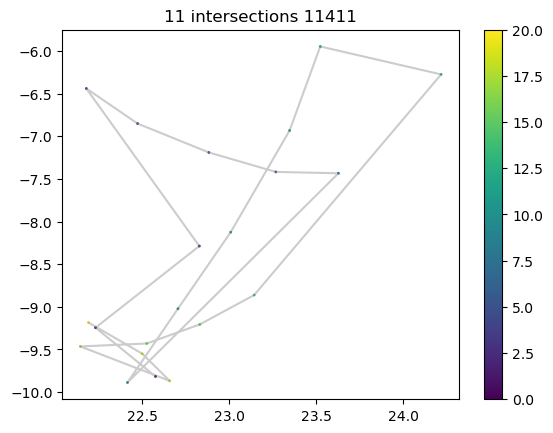

Unique intersecting points in DataFrame: 273
Total ratio: 0.005


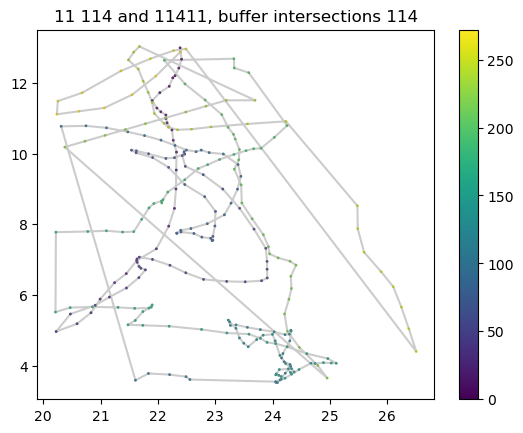

Unique intersecting points in DataFrame: 148
Total ratio: 0.003


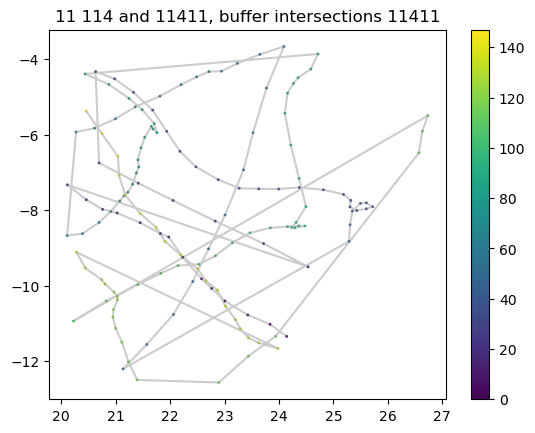

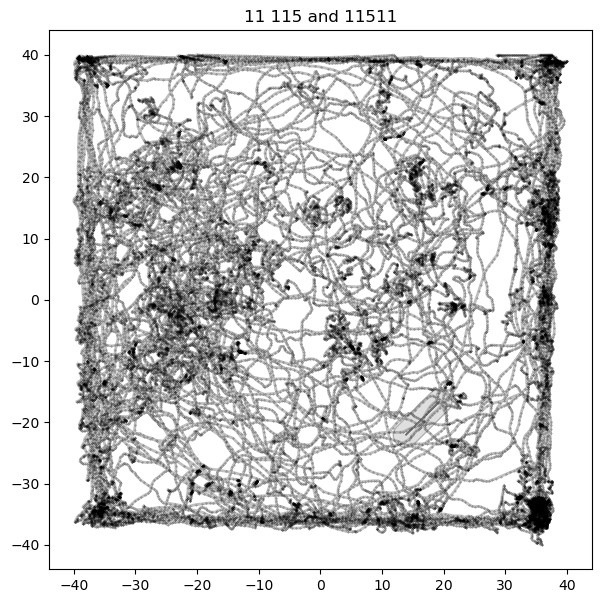

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


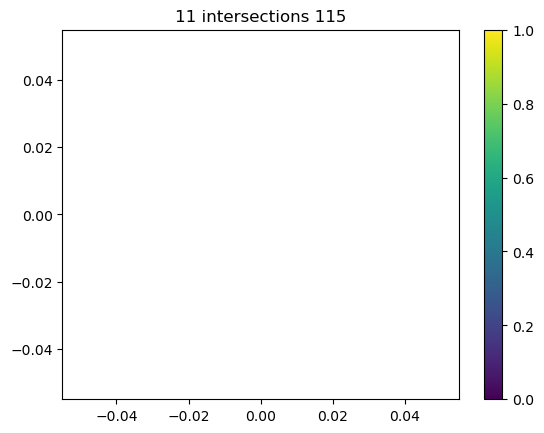

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


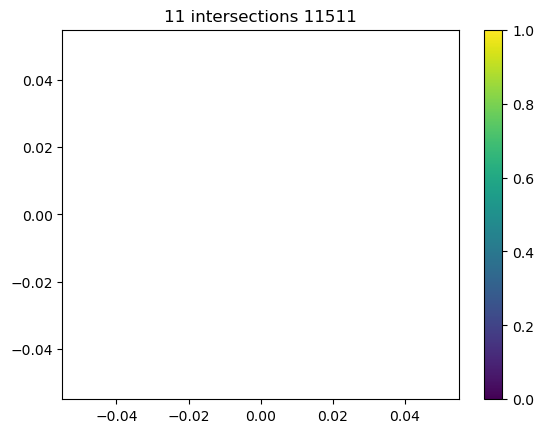

Unique intersecting points in DataFrame: 736
Total ratio: 0.013


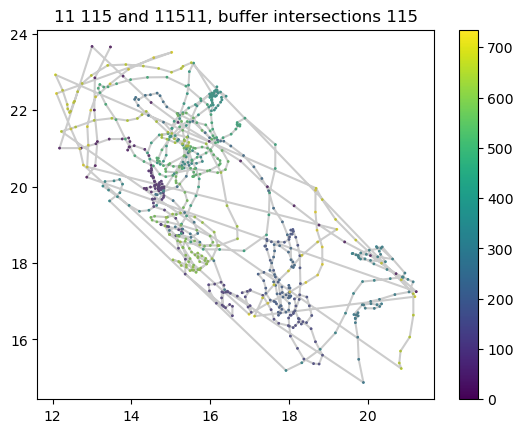

Unique intersecting points in DataFrame: 124
Total ratio: 0.002


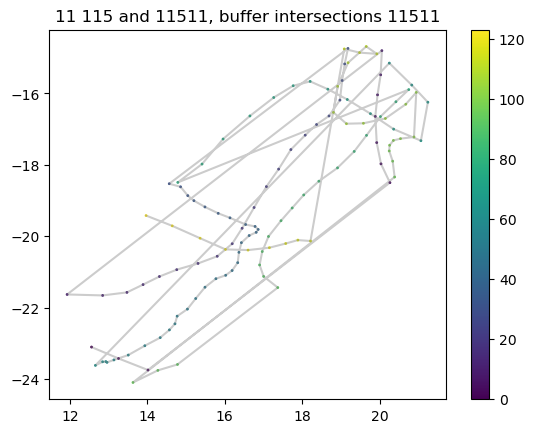

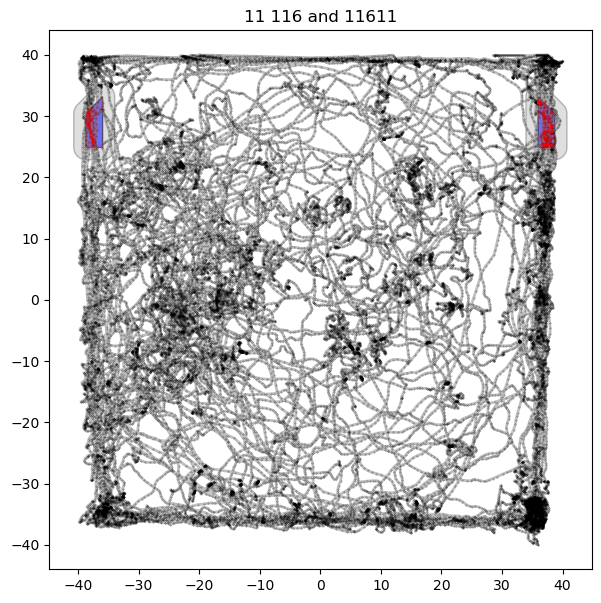

Unique intersecting points in DataFrame: 254
Total ratio: 0.004


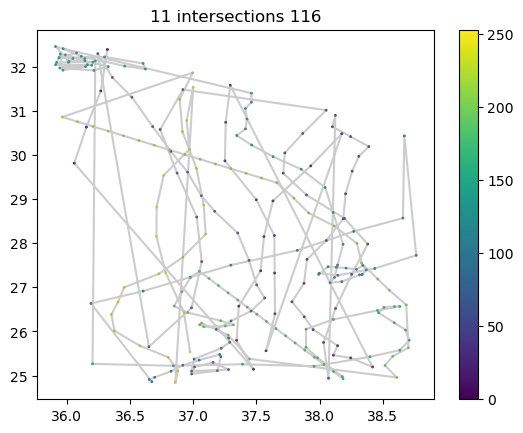

Unique intersecting points in DataFrame: 103
Total ratio: 0.002


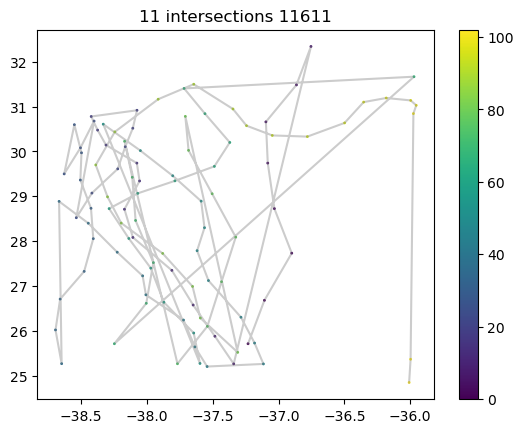

Unique intersecting points in DataFrame: 602
Total ratio: 0.011


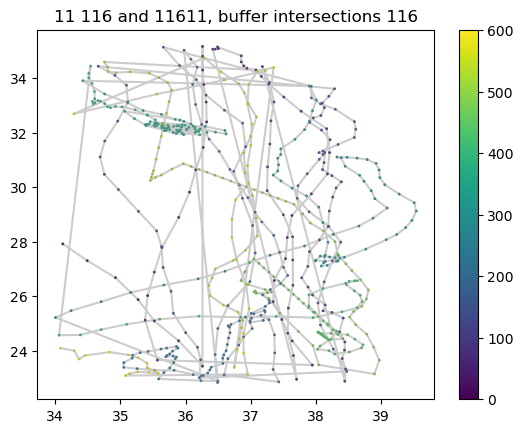

Unique intersecting points in DataFrame: 311
Total ratio: 0.005


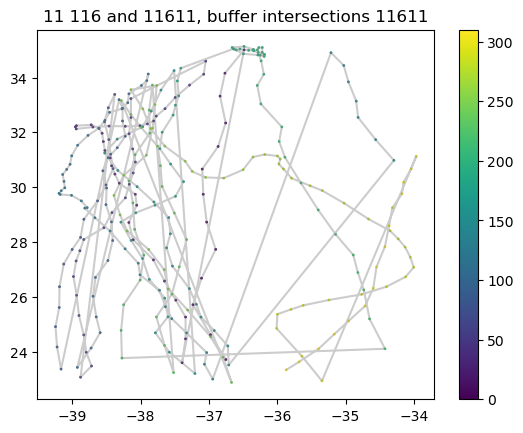

In [354]:
#2. find intersections with polygons, polygon buffers

dict_inter = {}
dict_buff = {}
polygon_names = []

# Calculate trajectory parts intersected with marks

#for comparison_pair in comparison_list:
for i in range(len(comparison_list)):
    comparison_pair = comparison_list[i]
    traj = dfs_step_sum_cut
    name_i = comparison_list[i][0][2]
    name_i_f = comparison_list[i][1][2]

    # for marks
    inters = find_traj_marks_intersections(tr=traj.copy(),
                                           marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
    df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
                                                      marks_interections=inters,
                                                      buff=False, title=str(k)+' intersections')
    df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
                                                                marks_interections=inters,
                                                                buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
    dict_inter[name_i] = tr_new
    dict_buff[name_i] = tr_new_buff
    polygon_names.append(name_i)
    #break

# форма распределения длины шагов, форма распределения углов поворота
# количество сэмплов остановки, кол-во сэмплов бега
big_dict_inter[k] = dict_inter
big_dict_buff[k] = dict_buff


In [358]:
# del big_dict_inter['5']

###### 14--------------------------------------------------------------------------------------------------------

14
1


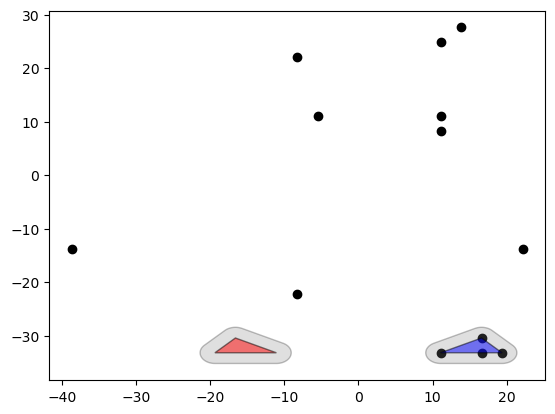

In [259]:
comparison_list = []

k = 14
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

traj = dfs_step_sum_cut
#plot_shapely_traj(to_shapely_traj(traj))

trN_coords = coords_dict[k]
trN_coords_x = [i[0] for i in trN_coords]
trN_coords_y = [i[1] for i in trN_coords]
plt.scatter(trN_coords_x, trN_coords_y, color='black')

#0 polygon - flipped пересекается с точкой
poly, buffer, lab = poly_list[0]
poly_f = hflip(poly)
buffer_f = hflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 140],
                        [poly_f, buffer_f, 14011]])
dict_compar_lists[k] = comparison_list

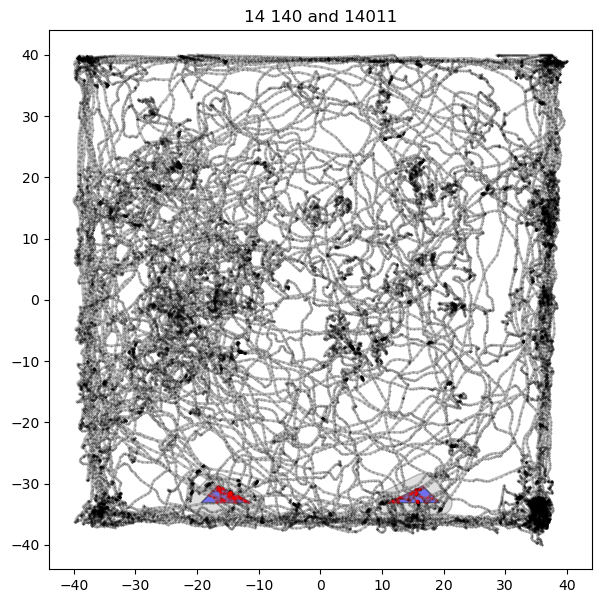

Unique intersecting points in DataFrame: 176
Total ratio: 0.003


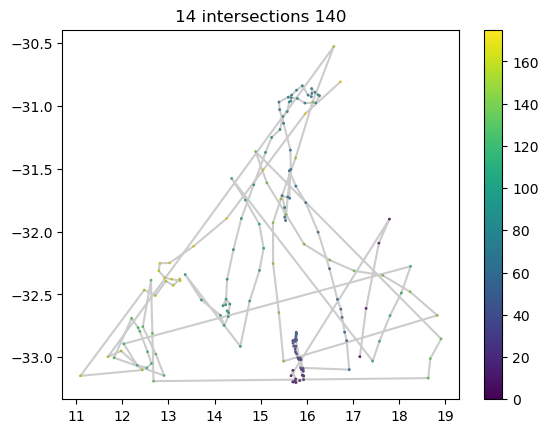

Unique intersecting points in DataFrame: 155
Total ratio: 0.003


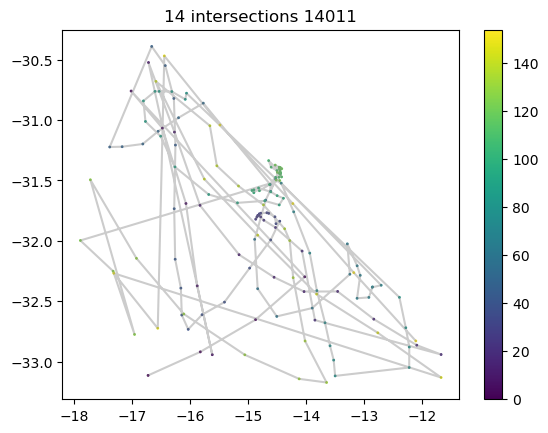

Unique intersecting points in DataFrame: 694
Total ratio: 0.012


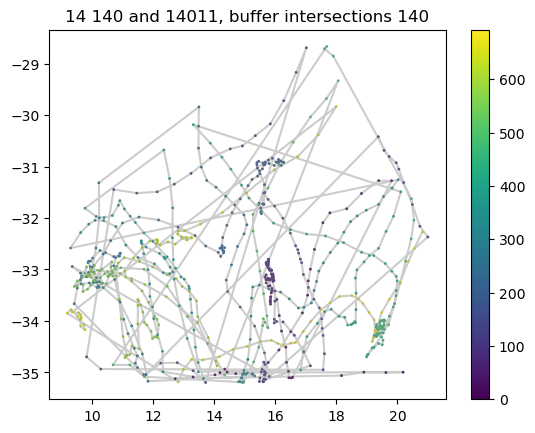

Unique intersecting points in DataFrame: 603
Total ratio: 0.011


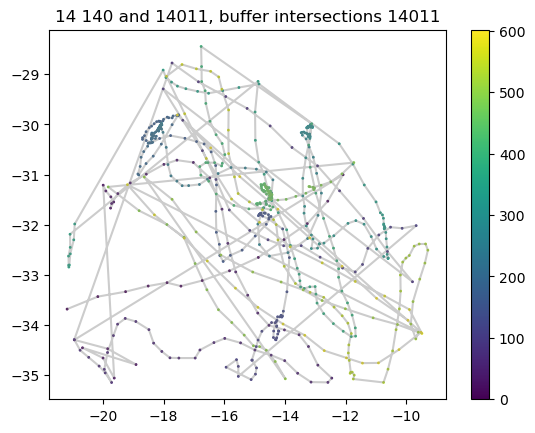

In [361]:
#2. find intersections with polygons, polygon buffers

dict_inter = {}
dict_buff = {}
polygon_names = []

# Calculate trajectory parts intersected with marks

#for comparison_pair in comparison_list:
for i in range(len(comparison_list)):
    comparison_pair = comparison_list[i]
    traj = dfs_step_sum_cut
    name_i = comparison_list[i][0][2]
    name_i_f = comparison_list[i][1][2]

    # for marks
    inters = find_traj_marks_intersections(tr=traj.copy(),
                                           marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
    df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
                                                      marks_interections=inters,
                                                      buff=False, title=str(k)+' intersections')
    df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
                                                                marks_interections=inters,
                                                                buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
    dict_inter[name_i] = tr_new
    dict_buff[name_i] = tr_new_buff
    #dict_tr6_inter[k+'_'+str(name_i)] = df_inters
    #dict_tr6_buff[k+'_'+str(name_i)] = df_inters_buff
    polygon_names.append(name_i)
    #break

# форма распределения длины шагов, форма распределения углов поворота
# количество сэмплов остановки, кол-во сэмплов бега
big_dict_inter[k] = dict_inter
big_dict_buff[k] = dict_buff


###### 18---------------------------------------------------------------------------------------------------------------------

18
2


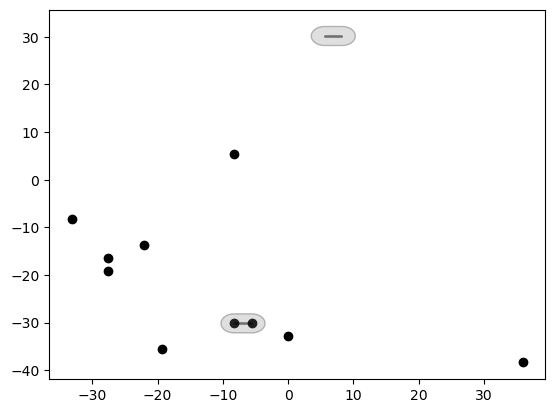

In [363]:
comparison_list = []

k = 18
k_old=k
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]


# Calculate trajectory parts intersected with marks

#plot_shapely_traj(to_shapely_traj(traj))

trN_coords = coords_dict[k]
trN_coords_x = [i[0] for i in trN_coords]
trN_coords_y = [i[1] for i in trN_coords]
plt.scatter(trN_coords_x, trN_coords_y, color='black')

#0 polygon - flipped пересекается с точкой
poly, buffer, lab = poly_list[0]
poly_f = vflip(hflip(poly))
buffer_f = vflip(hflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 180],
                        [poly_f, buffer_f, 18011]])
dict_compar_lists[k] = comparison_list

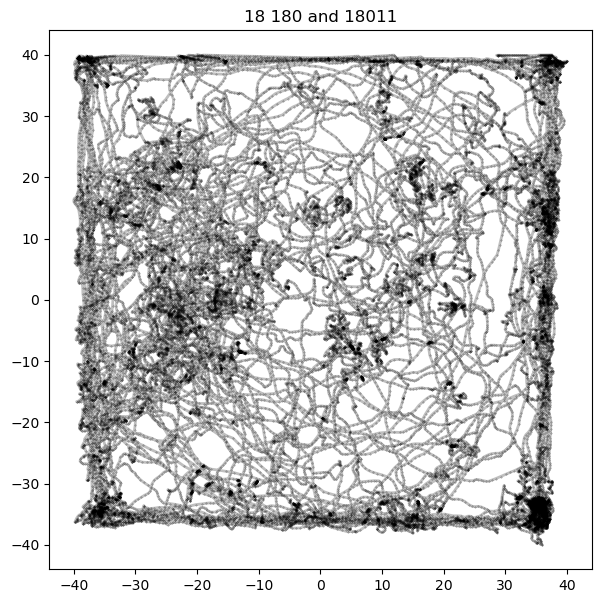

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


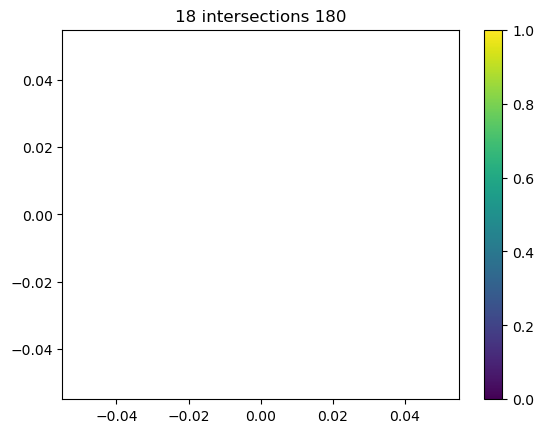

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


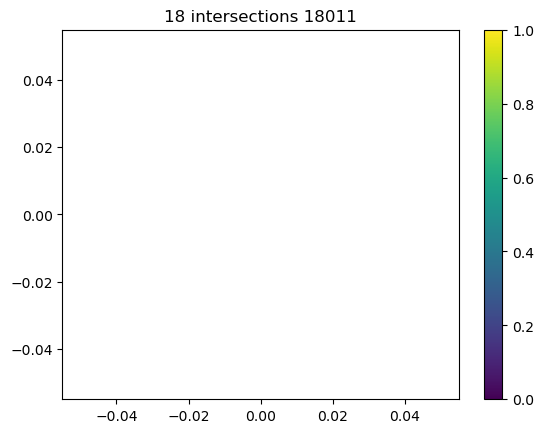

Unique intersecting points in DataFrame: 118
Total ratio: 0.002


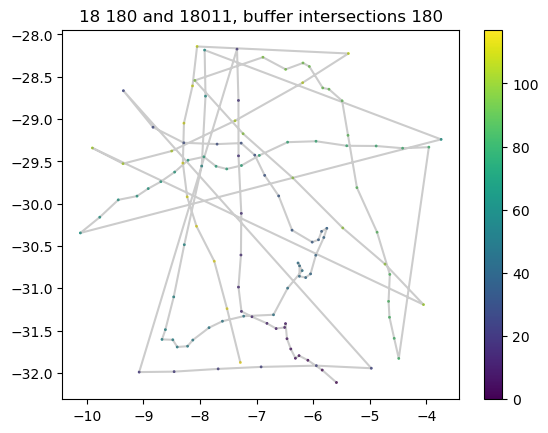

Unique intersecting points in DataFrame: 122
Total ratio: 0.002


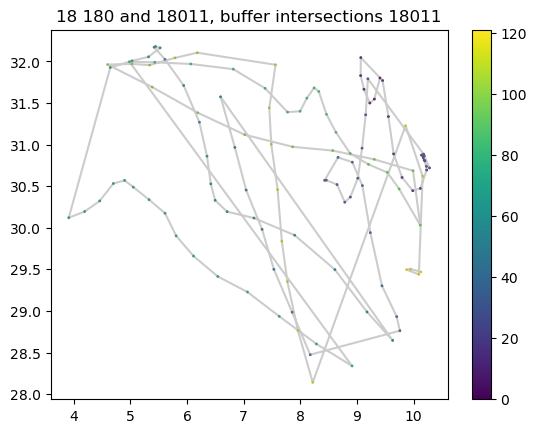

In [364]:
#2. find intersections with polygons, polygon buffers

dict_inter = {}
dict_buff = {}
polygon_names = []

# Calculate trajectory parts intersected with marks

#for comparison_pair in comparison_list:
for i in range(len(comparison_list)):
    comparison_pair = comparison_list[i]
    traj = dfs_step_sum_cut
    name_i = comparison_list[i][0][2]
    name_i_f = comparison_list[i][1][2]

    # for marks
    inters = find_traj_marks_intersections(tr=traj.copy(),
                                           marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
    df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
                                                      marks_interections=inters,
                                                      buff=False, title=str(k)+' intersections')
    df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
                                                                marks_interections=inters,
                                                                buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
    dict_inter[name_i] = tr_new
    dict_buff[name_i] = tr_new_buff
    #dict_tr6_inter[k+'_'+str(name_i)] = df_inters
    #dict_tr6_buff[k+'_'+str(name_i)] = df_inters_buff
    polygon_names.append(name_i)
    #break

# форма распределения длины шагов, форма распределения углов поворота
# количество сэмплов остановки, кол-во сэмплов бега
big_dict_inter[k] = dict_inter
big_dict_buff[k] = dict_buff


In [365]:
big_dict_inter

{4: {40:               time          x         y        Vx         Vy          V  \
  1         0.078213 -36.785817 -1.797726 -5.313871   7.440403   9.382820   
  2         0.110699 -37.054720 -1.452068 -5.575030   9.638147  11.529251   
  3         0.143199 -37.271032 -0.999033 -5.202303  12.120918  13.807093   
  4         0.174277 -37.456497 -0.588661 -3.911748  14.546245  15.929982   
  5         0.206507 -37.610407 -0.076148 -1.782446  16.828158  17.942977   
  ...            ...        ...       ...       ...        ...        ...   
  58516  1945.185707 -20.171687  7.249696  0.221039 -17.498210  17.797345   
  58517  1945.218450 -20.062538  6.669810  1.440599 -17.566238  17.827686   
  58518  1945.250936 -20.025340  6.066553  2.344588 -17.427643  17.714950   
  58519  1945.282616 -19.918855  5.531872  2.962039 -17.186316  17.528681   
  58520  1945.313759 -19.774409  5.033559  3.289841 -17.002124  17.386954   
  
         step_length      angles  near_wall  step_sum_0.5  interse

In [366]:
pickle.dump(big_dict_inter, open( DIR+"/big_dict_inter.p", "wb"))
pickle.dump(big_dict_buff, open( DIR+"/big_dict_buff.p", "wb"))

##### stats

In [367]:
big_dict_inter.keys()

dict_keys([4, 5, 11, 14, 18])

###### 4

In [371]:
big_dict_buff[4][42]['intersection'].value_counts()

0.0       55439
42.0       1092
4211.0      666
Name: intersection, dtype: int64

In [373]:
for a, aa in big_dict_buff.items():
    print(a)
    for b, bb in aa.items():
        print(b)
        print(bb['intersection'].value_counts())

4
40
0.0       56027
40.0        761
4011.0      409
Name: intersection, dtype: int64
42
0.0       55439
42.0       1092
4211.0      666
Name: intersection, dtype: int64
5
50
0.0       56836
5011.0      233
50.0        128
Name: intersection, dtype: int64
11
110
0.0        51325
110.0       5053
11011.0      819
Name: intersection, dtype: int64
112
0.0        54736
112.0       1892
11211.0      569
Name: intersection, dtype: int64
114
0.0        56776
114.0        273
11411.0      148
Name: intersection, dtype: int64
115
0.0        56337
115.0        736
11511.0      124
Name: intersection, dtype: int64
116
0.0        56284
116.0        602
11611.0      311
Name: intersection, dtype: int64
14
140
0.0        55900
140.0        694
14011.0      603
Name: intersection, dtype: int64
18
180
0.0        56957
18011.0      122
180.0        118
Name: intersection, dtype: int64


40


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


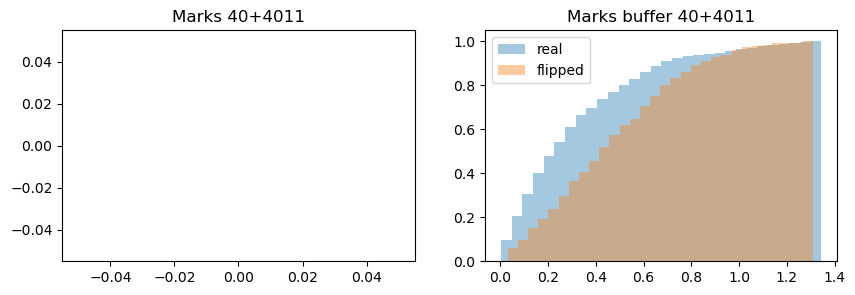

(0,) (0,)
intersection l = 0
(761,) (409,)
buffer
U1, p
103316.0 2.2814154074812454e-21
mean of original polygon buffer, std
0.3246592748225527 0.2791746299022113
mean of flipped polygon buffer
0.4729423628448885 0.2820058706215606


42


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\838430534.py:75: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


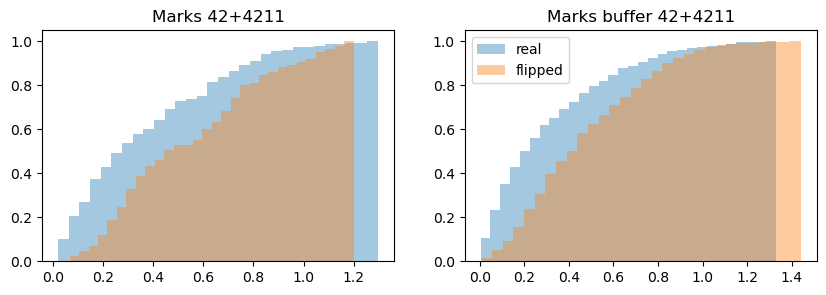

(156,) (85,)
intersection
U1, p
4340.0 9.536195409814074e-06
mean of original polygon, std
0.37268636807524286 0.29046349371199476
mean of flipped polygon, std
0.540515059473145 0.2951679054884614
(1092,) (666,)
buffer
U1, p
227235.0 7.613166941469597e-40
mean of original polygon buffer, std
0.3152023235332266 0.27720678512194014
mean of flipped polygon buffer
0.47685500433078465 0.2770455644278946




C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\838430534.py:57: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf1)


In [422]:
# 3. Step length parameter. Plot cumulative plots, print means, stds, statistics 
means_step_l = pd.DataFrame()

q = 4

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()]})
        means_step_l = means_step_l.append(lildf1)
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()]})
        means_step_l = means_step_l.append(lildf2)
    else:
        print('buffer l = 0')
    print('\n')
    

In [425]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean
0,40,buffer,0.0,103316.0,orig,0.324659
1,40,buffer,,,flipped,0.472942
0,42,intersect,0.00001,4340.0,orig,0.372686
1,42,intersect,,,flipped,0.540515
0,42,buffer,0.0,227235.0,orig,0.315202
1,42,buffer,,,flipped,0.476855


###### 5

50


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


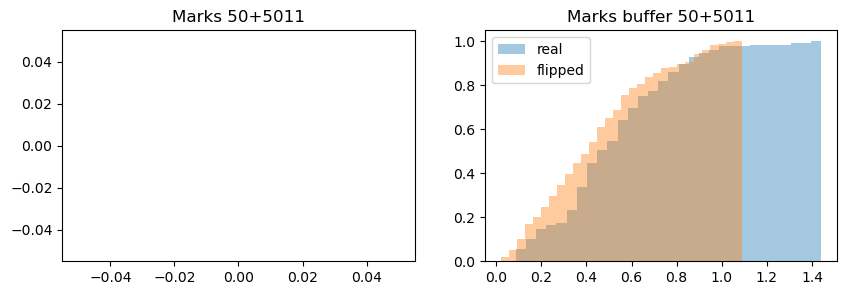

(0,) (0,)
intersection l = 0
(128,) (233,)
buffer
U1, p
17649.0 0.003913886586094812
mean of original polygon buffer, std
0.5233995696944282 0.2588961113438719
mean of flipped polygon buffer
0.44014900484556724 0.25333548391966726




C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3714980822.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


In [426]:
means_step_l = pd.DataFrame()

q = 5

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()]})
        means_step_l = means_step_l.append(lildf1)
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()]})
        means_step_l = means_step_l.append(lildf2)
    else:
        print('buffer l = 0')
    print('\n')
    

In [427]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean
0,50,buffer,0.003914,17649.0,orig,0.523400
1,50,buffer,,,flipped,0.440149


###### 11

110


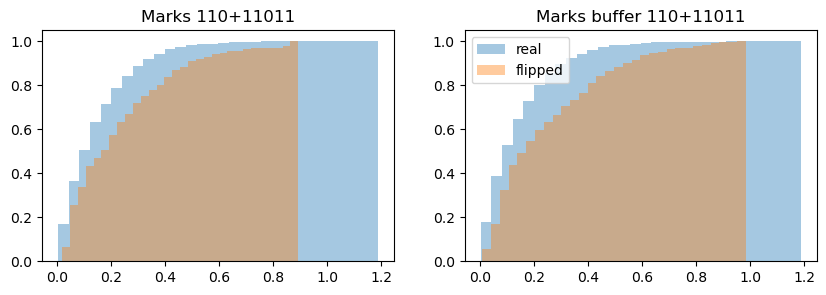

(2242,) (136,)
intersection
U1, p
114877.0 1.3427420367192736e-06
mean of original polygon, std
0.15506023357536045 0.1314901195567168
mean of flipped polygon, std
0.23689217455031408 0.19914031183753378
(5053,) (819,)
buffer
U1, p
1444202.0 7.539959448156984e-44
mean of original polygon buffer, std
0.14880399553748783 0.13118607817380465
mean of flipped polygon buffer
0.24988975899853746 0.2078345723022063


112


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3896437424.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf1)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3896437424.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


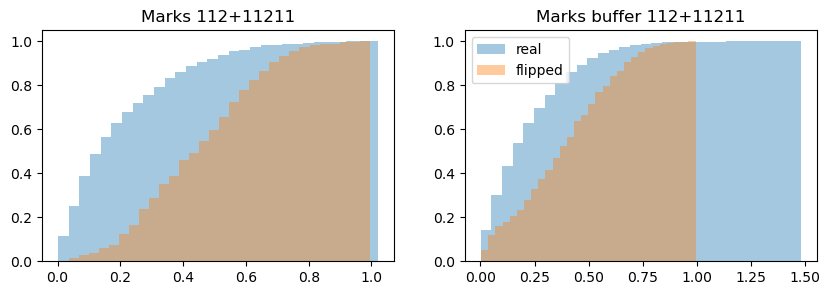

(1274,) (229,)
intersection
U1, p
47949.0 5.569389317289774e-59
mean of original polygon, std
0.20309896239669845 0.17946557356957923
mean of flipped polygon, std
0.4533984132209143 0.19174801977106393
(1892,) (569,)
buffer
U1, p
325436.0 1.6141774927923073e-46
mean of original polygon buffer, std
0.23284358350205522 0.19151381281964894
mean of flipped polygon buffer
0.38575794891965204 0.22677336608074425


114


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3896437424.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


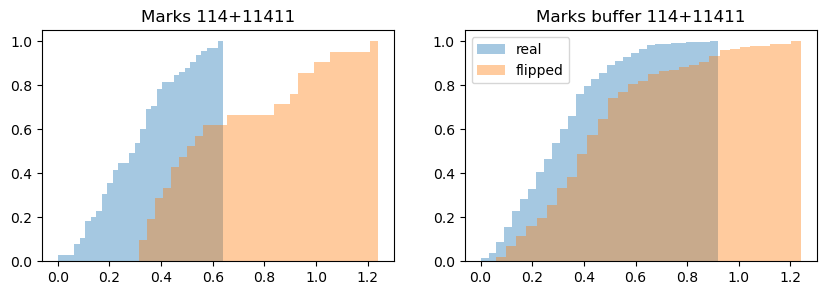

(65,) (21,)
intersection
U1, p
201.0 1.3304679322701541e-06
mean of original polygon, std
0.29478095562161055 0.15568569269795698
mean of flipped polygon, std
0.6271156472034862 0.2806223631789474
(273,) (148,)
buffer
U1, p
12451.0 7.921974420150282e-11
mean of original polygon buffer, std
0.30295728691378054 0.1686711257780607
mean of flipped polygon buffer
0.4566706960526945 0.24618726662199272


115


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3896437424.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf1)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3896437424.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


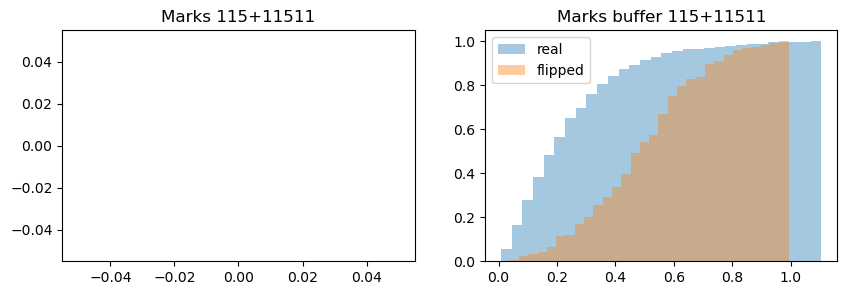

(0,) (0,)
intersection l = 0
(736,) (124,)
buffer
U1, p
15354.0 2.6661060924374166e-32
mean of original polygon buffer, std
0.24610682634433473 0.18778493133656007
mean of flipped polygon buffer
0.4944344599674083 0.19598274993761045


116


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3896437424.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


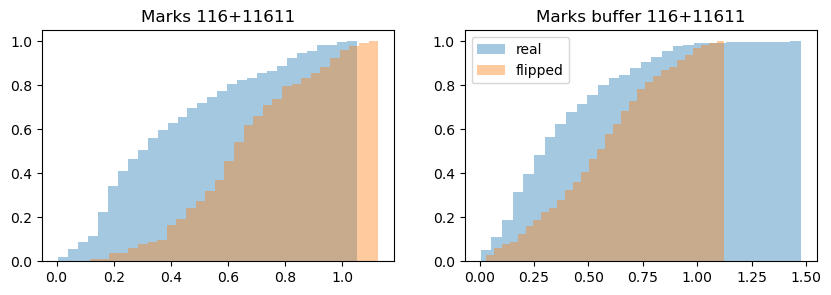

(254,) (103,)
intersection
U1, p
5834.0 2.355365397983948e-16
mean of original polygon, std
0.38777064528378463 0.2577162426671355
mean of flipped polygon, std
0.6467990417243463 0.21947632757718386
(602,) (311,)
buffer
U1, p
57161.0 4.806521651504226e-22
mean of original polygon buffer, std
0.37469302282081146 0.25941704723361564
mean of flipped polygon buffer
0.5539722888274011 0.26373776241908364




C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3896437424.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf1)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\3896437424.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


In [428]:
means_step_l = pd.DataFrame()

q = 11

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()]})
        means_step_l = means_step_l.append(lildf1)
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()]})
        means_step_l = means_step_l.append(lildf2)
    else:
        print('buffer l = 0')
    print('\n')
    

In [430]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean
0,110,intersect,0.000001,114877.0,orig,0.155060
1,110,intersect,,,flipped,0.236892
0,110,buffer,0.0,1444202.0,orig,0.148804
1,110,buffer,,,flipped,0.249890
0,112,intersect,0.0,47949.0,orig,0.203099
1,112,intersect,,,flipped,0.453398
0,112,buffer,0.0,325436.0,orig,0.232844
1,112,buffer,,,flipped,0.385758
0,114,intersect,0.000001,201.0,orig,0.294781
1,114,intersect,,,flipped,0.627116


###### 14

140


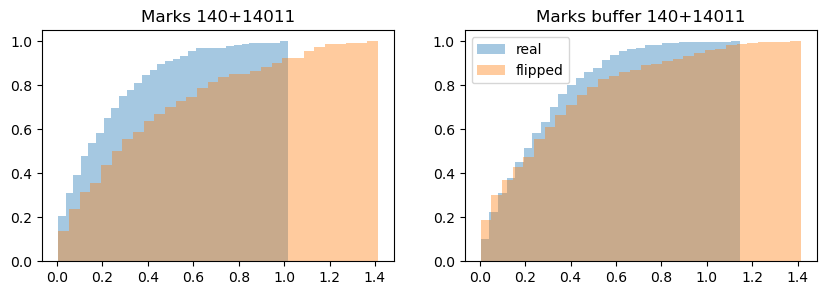

(176,) (155,)
intersection
U1, p
9381.0 9.495996790498434e-07
mean of original polygon, std
0.2110700256767249 0.19857858314832055
mean of flipped polygon, std
0.39684601406731657 0.3501511025614307
(694,) (603,)
buffer
U1, p
198936.0 0.12562426266386015
mean of original polygon buffer, std
0.26200090043323904 0.2017610438982675
mean of flipped polygon buffer
0.32586115728062376 0.30403876268863084




C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\223933561.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf1)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\223933561.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


In [431]:
means_step_l = pd.DataFrame()

q = 14

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()]})
        means_step_l = means_step_l.append(lildf1)
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()]})
        means_step_l = means_step_l.append(lildf2)
    else:
        print('buffer l = 0')
    print('\n')
    

In [433]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean
0,140,intersect,0.000001,9381.0,orig,0.211070
1,140,intersect,,,flipped,0.396846
0,140,buffer,0.125624,198936.0,orig,0.262001
1,140,buffer,,,flipped,0.325861


###### 18

180


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


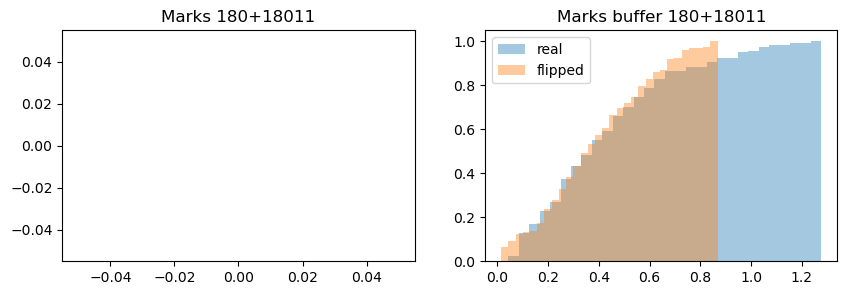

(0,) (0,)
intersection l = 0
(118,) (122,)
buffer
U1, p
7597.0 0.45861967517516133
mean of original polygon buffer, std
0.43180908537601925 0.2728060243392771
mean of flipped polygon buffer
0.38502943512140575 0.21653936230606968




C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\356202089.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


In [434]:
means_step_l = pd.DataFrame()

q = 18

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()]})
        means_step_l = means_step_l.append(lildf1)
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()]})
        means_step_l = means_step_l.append(lildf2)
    else:
        print('buffer l = 0')
    print('\n')
    

In [436]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean
0,180,buffer,0.45862,7597.0,orig,0.431809
1,180,buffer,,,flipped,0.385029


# old

### old intersections

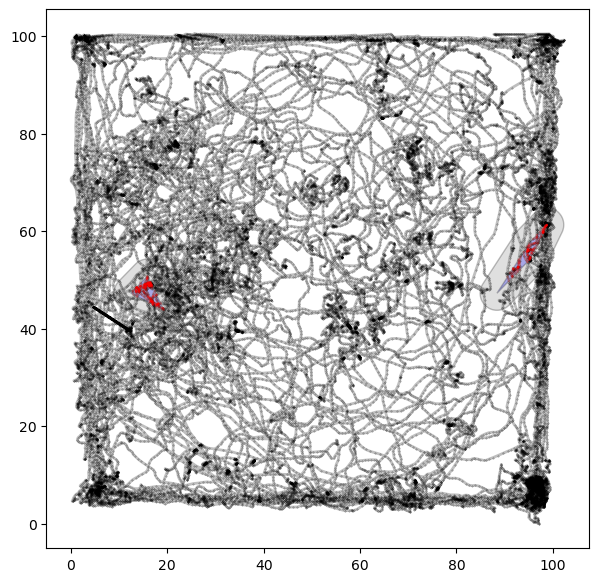

In [194]:
from shapely.geometry import LineString, MultiLineString


def plot_intersected_element(intersection):
    if intersection.geom_type == 'MultiLineString':
        for geom in intersection.geoms:
            x, y = geom.xy
            plt.plot(x, y, color='red', linewidth=1.5,
                    alpha=0.2, zorder=4)
    elif intersection.geom_type == 'LineString':
        x, y = intersection.xy
        plt.plot(x, y, color='red', linewidth=1.5,
                alpha=0.2, label='Intersection', zorder=4)


def plot_shapely_traj(trajectory):
    x, y = trajectory.xy
    plt.plot(x, y, color='grey', linewidth=2,
             label='Trajectory', alpha=0.5)
    plt.plot(x, y, color='black',  marker='o', ls='',
             markersize=0.3, alpha=0.5)


def plot_shapely_marks(polygon, poly_buffer):
    # plot mark poly + buffer
    x_zone, y_zone = poly_buffer.exterior.xy
    plt.fill(x_zone, y_zone, alpha=0.25, linewidth=1, linestyle='-',
                edgecolor='black', facecolor='gray', label='Zone Polygon')
    x_poly, y_poly = polygon.exterior.xy
    plt.fill(x_poly, y_poly, alpha=0.25, linewidth=1, linestyle='-',
                facecolor='blue', edgecolor='black', label='')


def find_traj_marks_intersections(tr, marks_poly_list, show=True):
    """
    tr: df with trajectory and x,y coordinates
    marks_poly_list: 
    """
    points = tr[['x', 'y']].to_numpy()
    trajectory_points = [(xy[0], xy[1]) for xy in points]
    trajectory = LineString(trajectory_points)

    plt.figure(figsize=(7, 7))
    marks_interections = []
    for polygon, poly_buffer, lab in marks_poly_list:

        intersection = polygon.intersection(trajectory)
        intersection_buffer = poly_buffer.intersection(trajectory)
        marks_interections.append([intersection, intersection_buffer, lab])

        # plotting traj, marks and intersections
        if not intersection.is_empty and show:
            plot_intersected_element(intersection)
            #print('intersection_buffer', intersection_buffer)
            plot_shapely_marks(polygon, poly_buffer)
            #print('polygon', polygon)
    if show:
        plot_shapely_traj(trajectory)
        plt.show()

    return marks_interections


marks_interections = find_traj_marks_intersections(traj_whole, all_polygons[4])

In [191]:
marks_poly_list

[[<POLYGON ((39.83 12.599, 43.302 12.599, 39.83 12.599, 43.302 12.599, 39.83 1...>,
  <POLYGON ((36.33 12.599, 36.346 12.942, 36.397 13.282, 36.48 13.615, 36.596 ...>,
  0],
 [<POLYGON ((15.525 26.609, 15.525 30.112, 15.525 30.112, 15.525 26.609))>,
  <POLYGON ((19.025 26.609, 19.008 26.266, 18.957 25.927, 18.874 25.593, 18.75...>,
  1]]

In [190]:
marks_interections

[[<LINESTRING EMPTY>,
  <MULTILINESTRING ((36.332 12.559, 36.353 12.611, 36.409 13.04, 36.543 13.351...>,
  0],
 [<LINESTRING EMPTY>,
  <MULTILINESTRING ((16.89 33.333, 16.888 33.277, 16.924 33.169, 16.872 33.022...>,
  1]]

In [133]:
traj_whole

,time,x,y
0,0.030712,4.635214,47.569576
1,0.078213,4.113290,47.997292
2,0.110699,3.769167,48.431576
3,0.143199,3.492345,49.000769
4,0.174277,3.255000,49.516360
...,...,...,...
58516,1945.185707,25.374909,59.364462
58517,1945.218450,25.514591,58.635894
58518,1945.250936,25.562193,57.877963
58519,1945.282616,25.698466,57.206190


### old, their heatmaps of cell firing

In [15]:
pwd

'C:\\Users\\dmitry.plotnikov\\analysis'

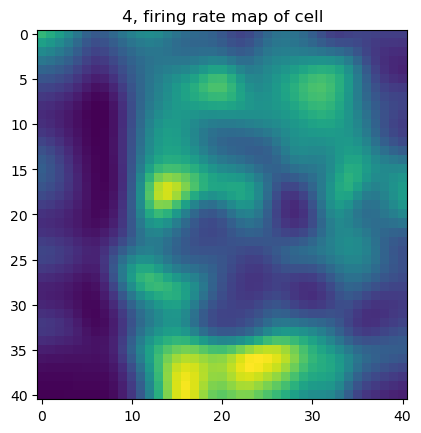

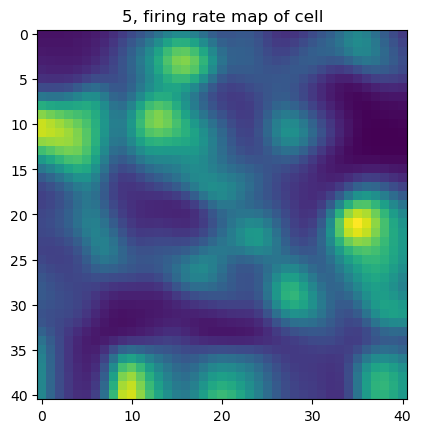

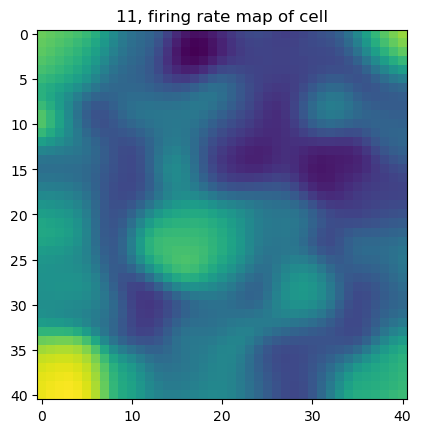

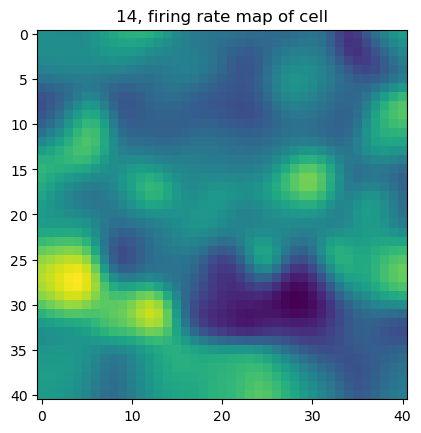

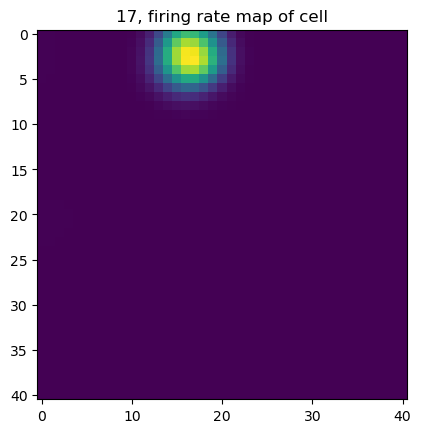

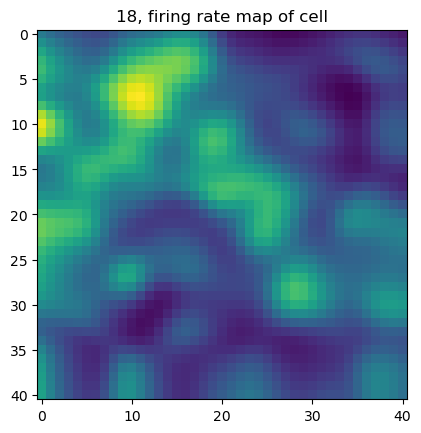

In [18]:
for n in clust_ns:
    hm = df_1sess.loc[df_1sess['cluster_id']==n]['firing_maps'].values[0]
    # hm_clusters['signal'+str(i)] = hm
    plt.imshow(hm)
    plt.title( str(n)+ ", firing rate map of cell" ) 
    plt.savefig('C:\\Users\\dmitry.plotnikov\\analysis\\their_cell_HM\\'+str(n)+'hm.png')
    plt.show()

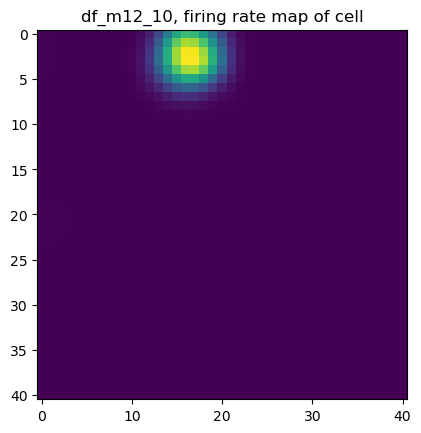

In [14]:
n=17
hm = df_1sess.loc[df_1sess['cluster_id']==n]['firing_maps'].values[0]
# hm_clusters['signal'+str(i)] = hm
plt.imshow(hm)
plt.title( k+ ", firing rate map of cell" ) 
#plt.savefig('C:\\Users\\Lenovo\\1navigation\\output\\'+k+'hm.png')
plt.show() 

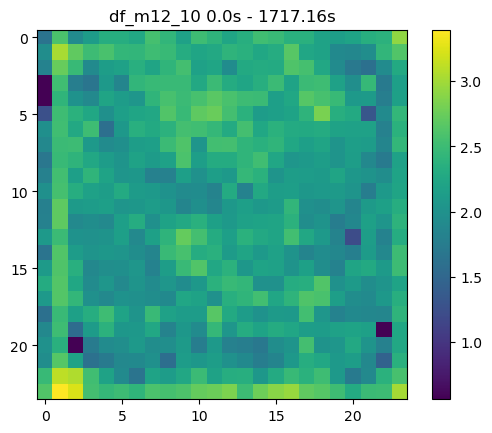

In [93]:
# #occupancy map
# k = 'df_m12_10'
# k_add = ' '+str(round(resampled_df['time'].min(),2))+'s - '+str(round(resampled_df['time'].max(), 2))+'s' 
# occ = occupMapNorm(resampled_df[['time', 'x', 'y']], binn=25)

# # sns.heatmap(occ, square=True, xticklabels=False,
# #             yticklabels=False, cmap='Blues')
# #occ_s = fourier_gaussian(occ, 0.8, n=-1)
# plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
# plt.title(k + k_add)
# plt.colorbar()
# k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
# # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
# plt.show()

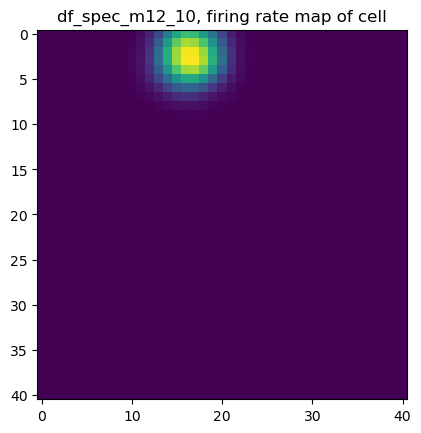

In [112]:
# i=17
# hm = df_1sess.loc[df_1sess['cluster_id']==i]['firing_maps'].values[0]
# # hm_clusters['signal'+str(i)] = hm
# plt.imshow(hm)
# plt.title( k+ ", firing rate map of cell" ) 
# #plt.savefig('C:\\Users\\Lenovo\\1navigation\\output\\'+k+'hm.png')
# plt.show() 

#### если делать количество точек выше какого-то порога

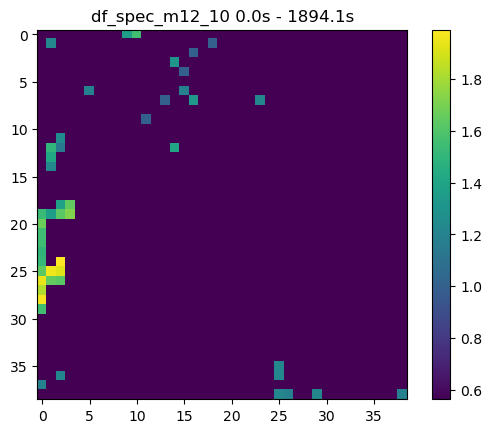

In [138]:
df_spec = resampled_df_2.loc[resampled_df_2['signal17']>=0.001]
k = 'df_spec_m12_10'
k_add = ' '+str(round(df_spec['time'].min(),2))+'s - '+str(round(df_spec['time'].max(), 2))+'s' 
occ = occupMapNorm(df_spec[['time', 'x', 'y']], binn=40)
plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
k_add2 = '_'+str(round(df_spec['time'].min(),2))+'s_ '+str(round(df_spec['time'].max(), 2))+'s'
plt.show()


In [141]:
smoothed_matrix3 = gaussian_filter(occ3, sigma=1)
plt.imshow(smoothed_matrix3)

NameError: name 'occ3' is not defined

##### если брать среднюю активность нейрона в этой точке - что-то не так

In [63]:
def occupMean(df, binn, s='signal19', eps=0.1):
    """ 
    делаем df где будет понятно сколько было точек в каждом бине 
    соответсвуеющему данному интервалу х и данному интервалу у
    """
    xmin = df["x"].min() - eps
    xmax = df["x"].max() + eps
    binx = np.linspace(xmin, xmax, binn)
    x_cut = pd.cut(df.x, binx, right=False)

    ymin = df["y"].min() - eps
    ymax = df["y"].max() + eps
    biny = np.linspace(ymin, ymax, binn)
    y_cut = pd.cut(df.y, biny, right=False)

    dfn = df.groupby([x_cut, y_cut], observed=False).mean()
    
    dfn = dfn.drop(columns=['x', 'y', 'time'])
    dfn = dfn.rename(columns={s: 'mean'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    arrd = dd.replace(0., 1).to_numpy()
    arrl = np.log(arrd)

    # arrl = df_minmax(arrl)
    return arrl

In [ ]:
resampled_df

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22940\2187721434.py:27: RuntimeWarning: invalid value encountered in log
  arrl = np.log(arrd)


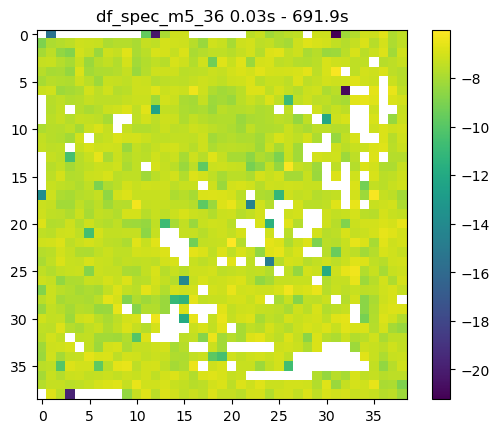

In [65]:
occ_n_m = occupMean(resampled_df[['time', 'x', 'y', 'signal19']], binn=40)
plt.imshow(occ_n_m) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
k_add2 = '_'+str(round(df_spec['time'].min(),2))+'s_ '+str(round(df_spec['time'].max(), 2))+'s'
plt.show()


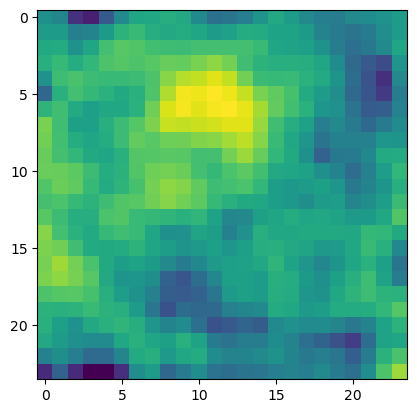

In [54]:
smoothed_matrix2 = gaussian_filter(occ_n_m, sigma=0.7)
plt.imshow(smoothed_matrix2)

### 0.7 the rest

In [130]:

resampled_dfnp = resample(tr_np[:, 1:], num_new_points, axis=0)
new_time = np.linspace(0, max(sign_time), num_new_points)
#new_sign = resample(sign_np[:, 1:], num_new_points, axis=0)
resampled_df_2 = pd.DataFrame({'time': new_time,
                                     'x': resampled_dfnp[:, 0], 
                                     'y': resampled_dfnp[:, 1],
                                    'signal'+str(int(dat1['cluster_id'])):new_sign})


In [132]:
resampled_df_2

,time,x,y,signal17
0,0.000000,4.635214,47.569576,0.001317
1,0.003333,0.983173,50.059208,-0.000240
2,0.006667,-1.732328,51.912037,0.000130
3,0.010000,-3.508213,53.125926,-0.000089
4,0.013333,-4.386152,53.729193,0.000067
...,...,...,...,...
568225,1894.083333,33.749771,27.743530,0.000719
568226,1894.086667,26.976952,32.354032,0.001029
568227,1894.090000,20.497625,36.765345,0.001705
568228,1894.093333,14.507016,40.844658,0.002002


In [133]:
#resampled_df_2.to_pickle('M12_2018-03-26_14-00-10_of_sign17_with_artifact.pkl')